# 08 Exercises: Vector time series, spatiotemporal analysis, SNOTEL

UW Geospatial Data Analysis  
CEE467/CEWA567  
David Shean  

## Objectives
* Explore spatial and temporal relationships of time series data, collected by networks of in-situ stations
* Learn about dynamic API queries, data ingestion into Pandas/GeoPandas
* Working with Pandas Timestamp and Python DateTime objects
* Explore spatial correlation of time series records
* Explore some simple interpolation routines to create continuous gridded values from sparse points
* Explore some fundamental concepts and metrics for snow science
* Visualize recent snow accumulation in your region

In [ ]:
import os
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
import contextily as ctx
import scipy.stats
import scipy.interpolate

In [ ]:
#Define variable to store current year (needed later)
#curr_y = datetime.now().year
curr_y = pd.to_datetime("today").year
curr_y

2023

## Part 0: Prepare and load data
* The 08_SNOTEL_download notebook in the Jupyterbook will prepare a geojson of SNOTEL sites with metadata and pickled DataFrames containing snow depth time series for all sites
* May require ~30-40 minutes to query all sites and download data.
* Once files are saved to disk, update the path to the data directory containing these files.

In [ ]:
snotel_datadir = '/home/jovyan/jupyterbook/book/modules/08_Vector_TimeSeries_SNOTEL/snotel_data'

In [ ]:
!ls $snotel_datadir

SNOTEL_CONUS_all.nc	 SNOTEL-SNWD_D_679_WA_SNTL.pkl	SNOTEL-WTEQ_D_WA.pkl
snotel_conus_sites.json  SNOTEL-SNWD_D_CONUS_all.pkl


In [ ]:
sites_fn = os.path.join(snotel_datadir, 'snotel_conus_sites.json')
singlesite_pkl_fn = os.path.join(snotel_datadir, 'SNOTEL-SNWD_D_679_WA_SNTL.pkl')
allsites_pkl_fn = os.path.join(snotel_datadir, 'SNOTEL-SNWD_D_CONUS_all.pkl')

In [ ]:
!ls -lh $sites_fn $singlesite_pkl_fn $allsites_pkl_fn

-rw-rw-r-- 1 jovyan users 499K Feb 25 22:39 /home/jovyan/jupyterbook/book/modules/08_Vector_TimeSeries_SNOTEL/snotel_data/snotel_conus_sites.json
-rw-rw-r-- 1 jovyan users 386K Feb 25 23:46 /home/jovyan/jupyterbook/book/modules/08_Vector_TimeSeries_SNOTEL/snotel_data/SNOTEL-SNWD_D_679_WA_SNTL.pkl
-rw-rw-r-- 1 jovyan users  87M Feb 25 23:43 /home/jovyan/jupyterbook/book/modules/08_Vector_TimeSeries_SNOTEL/snotel_data/SNOTEL-SNWD_D_CONUS_all.pkl


If you get errors running the above cells, check to make sure your path is correct, and check that the demo notebook ran successfully.  You can always delete the files in that data directory, and rerun the demo notebook.

### Load state polygons

In [ ]:
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

### Load SNOTEL sites geojson

In [ ]:
#Note: geojson uses integer index, so need the `set_index` below
sites_gdf_all = gpd.read_file(sites_fn).set_index('index')
sites_gdf_all.head()

,code,name,network,elevation_m,county,state,pos_accuracy_m,beginDate,endDate,HUC,HUD,TimeZone,actonId,shefId,stationTriplet,isActive,HUC2,HUC6,geometry
index,,,,,,,,,,,,,,,,,,,
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,Modoc,California,0,10/1/1983 12:00:00 AM,1/1/2100 12:00:00 AM,180200021403,18020002,-8.0,20H13S,ADMC1,301:CA:SNTL,True,18,180200,POINT (-120.79192 41.23583)
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,Kane,Utah,0,10/1/1994 12:00:00 AM,1/1/2100 12:00:00 AM,160300020301,16030002,-8.0,12M26S,AGUU1,907:UT:SNTL,True,16,160300,POINT (-112.27118 37.52217)
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,Madison,Montana,0,9/1/1996 12:00:00 AM,1/1/2100 12:00:00 AM,100200050701,10020005,-8.0,11D28S,ABRM8,916:MT:SNTL,True,10,100200,POINT (-111.95902 45.59723)
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,King,Washington,0,9/1/1994 12:00:00 AM,1/1/2100 12:00:00 AM,171100100501,17110010,-8.0,21B48S,APSW1,908:WA:SNTL,True,17,171100,POINT (-121.69847 47.77957)
SNOTEL:302_OR_SNTL,302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,Wallowa,Oregon,0,10/1/1980 12:00:00 AM,1/1/2100 12:00:00 AM,170601050101,17060105,-8.0,17D02S,ANRO3,302:OR:SNTL,True,17,170601,POINT (-117.19258 45.21328)


In [ ]:
sites_chull = sites_gdf_all.unary_union.convex_hull

### Load mountain range polygons
These can be used for spatial join and aggregation to consider differences across the Western U.S.
* https://www.earthenv.org/mountains
* https://rmgsc.cr.usgs.gov/gme/

In [ ]:
gmba_url = 'https://data.earthenv.org/mountains/standard/GMBA_Inventory_v2.0_standard_300.zip'
#gmba_fn = 'GMBA_Inventory_v2.0_standard_300/GMBA_Inventory_v2.0_standard_300.shp'
gmba_fn = 'GMBA_Inventory_v2.0_standard_300.shp'

In [ ]:
print(f'zip+{gmba_url}!{gmba_fn}')

zip+https://data.earthenv.org/mountains/standard/GMBA_Inventory_v2.0_standard_300.zip!GMBA_Inventory_v2.0_standard_300.shp


In [ ]:
gmba_gdf = gpd.read_file(f'zip+{gmba_url}!{gmba_fn}')

In [ ]:
#gmba_gdf.plot()

In [ ]:
gmba_gdf_us = gmba_gdf[gmba_gdf.intersects(sites_chull)]

<Axes: >

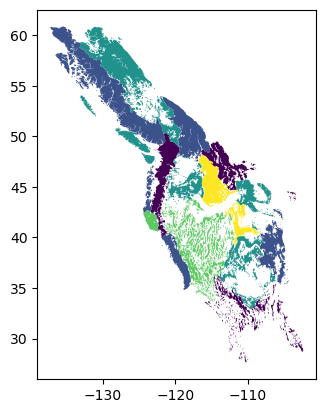

In [ ]:
gmba_gdf_us.plot(column='Color300')

### Load watershed polygons
* USGS Water Boundary Dataset
* Want high-level HU2 regional polygons
* 2.3 GB https://prd-tnm.s3.amazonaws.com/StagedProducts/Hydrography/WBD/National/GDB/WBD_National_GDB.zip

In [ ]:
#url = 'https://hydro.nationalmap.gov/arcgis/rest/services/wbd/MapServer/1'
#url += '/export?bbox=-185.3,-28.8,-59.5,118.1'

In [ ]:
#import urllib

In [ ]:
#response = urllib.request.urlopen(url)
#json = response.read()

## Part 1: Evaluate SNOTEL sites
* Create a plot using geopandas explore to get a better sense of distribution, site names and other fields
* When you're done, comment this out, and rerun the cell to clear the plot, then save the notebook

In [ ]:
#m = gmba_gdf_us.explore(style_kwds={'opacity':0.5}, tooltip=['Name_EN'])
#sites_gdf_all.explore(m=m, column='elevation_m', cmap='inferno')

## Reproject the sites GeoDataFrame
* Can use the same Albers Equal Area projection from previous labs, or recompute based on bounds and center of SNOTEL sites

In [ ]:
aea_proj = '+proj=aea +lat_1=37.00 +lat_2=47.00 +lat_0=42.00 +lon_0=-114.27'
sites_gdf_all_proj = sites_gdf_all.to_crs(aea_proj)

In [ ]:
#Reproject states
states_gdf_proj = states_gdf.to_crs(aea_proj)

In [ ]:
#Reproject mountains
gmba_gdf_us_proj = gmba_gdf_us.to_crs(aea_proj)

In [ ]:
#Isolate WA state polygon
wa_state = states_gdf_proj.loc[states_gdf_proj['NAME'] == 'Washington']

### Create a scatterplot and overlay the state polygons

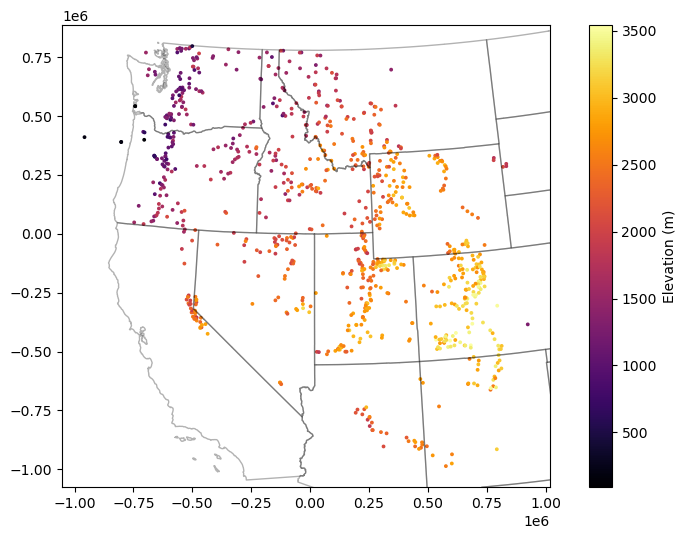

In [ ]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all_proj.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True, legend_kwds={'label':'Elevation (m)'})
ax.autoscale(False)
states_gdf_proj.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

### Isolate WA sites
* As with the GLAS point example, we could do `intersects` or a spatial join with WA polygon
* But probably easiest to filter records with 'WA' in the index
    * Note: need to convert the SNOTEL DataFrame index to `str`
    * `contains` might be a nice option
* Sanity check - note number of records and create a quick scatterplot to verify

In [ ]:
wa_idx = sites_gdf_all_proj.index.str.contains('WA')
sites_gdf_wa = sites_gdf_all_proj[wa_idx]
sites_gdf_wa.shape

(84, 19)

In [ ]:
#Prepare list of WA stations for use later in lab
#Can preserve as Pandas Index object
wa_stations = sites_gdf_all_proj.index[wa_idx]
#Or convert to list, if desired
#wa_stations = list(sites_gdf_all_proj.index[wa_idx])
wa_stations.shape

(84,)

In [ ]:
#Prepare a list of WA stations above a predefined elevation threshold
high_thresh = 1400 #meters
wa_stations_high = sites_gdf_wa.index[sites_gdf_wa['elevation_m'] > high_thresh]
wa_stations_high.shape

(32,)

## Create scatterplot to verify and add contextily basemap
* Can specify our AEA crs to the `crs` keyword in the ctx `add_basemap` function to reproject on the fly

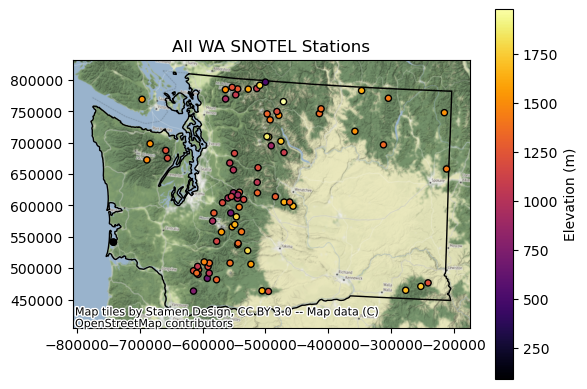

In [ ]:
f, ax = plt.subplots()
wa_state.plot(ax=ax, facecolor='none', edgecolor='black')
sites_gdf_wa.plot(ax=ax, column='elevation_m', markersize=20, edgecolor='k', cmap='inferno', \
                  legend=True, legend_kwds={'label':'Elevation (m)'})
ctx.add_basemap(ax=ax, crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain)
ax.set_title('All WA SNOTEL Stations');

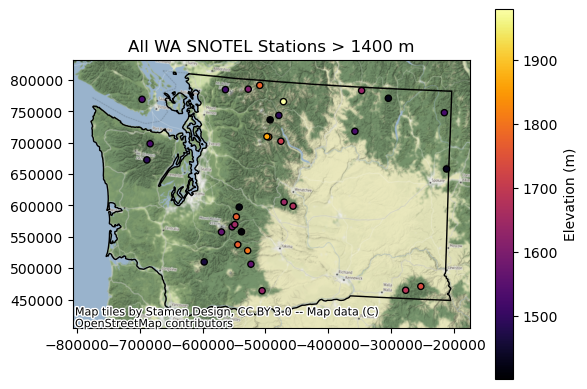

In [ ]:
f, ax = plt.subplots()
wa_state.plot(ax=ax, facecolor='none', edgecolor='black')
sites_gdf_wa.loc[wa_stations_high].plot(ax=ax, column='elevation_m', markersize=20, edgecolor='k', \
                                        cmap='inferno', legend=True, legend_kwds={'label':'Elevation (m)'})
ctx.add_basemap(ax=ax, crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain)
ax.set_title('All WA SNOTEL Stations > %0.0f m' % high_thresh);

### Create a histogram showing elevation of WA sites and all sites in Western US
* These should be two histograms on the same axes
* Thought questions 🤔 
    * *Do these elevations seem to provide a good sample of elevations where we expect snow to accumulate?*
    * *What do you notice about the WA sample?*

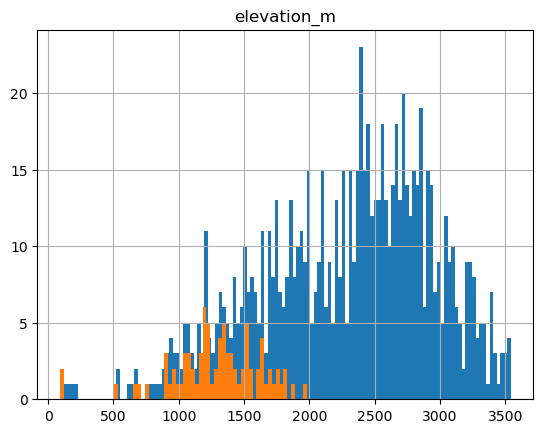

In [ ]:
ax = sites_gdf_all.hist('elevation_m', bins=128)
sites_gdf_wa.hist('elevation_m', bins=64, ax=ax);

### What is the highest site in WA?

In [ ]:
sitecode_max = sites_gdf_wa['elevation_m'].idxmax()
sites_gdf_wa.loc[sitecode_max]

code                                               515_WA_SNTL
name                                                Harts Pass
network                                                 SNOTEL
elevation_m                                        1978.151978
county                                                Okanogan
state                                               Washington
pos_accuracy_m                                               0
beginDate                                10/1/1979 12:00:00 AM
endDate                                   1/1/2100 12:00:00 AM
HUC                                               171100050501
HUD                                                   17020008
TimeZone                                                  -8.0
actonId                                                 20A05S
shefId                                                   HRPW1
stationTriplet                                     515:WA:SNTL
isActive                                               

### What is highest site in Western U.S.?

In [ ]:
sitecode_max = sites_gdf_all['elevation_m'].idxmax()
sites_gdf_all.loc[sitecode_max]

code                                               1058_CO_SNTL
name                                                   Grayback
network                                                  SNOTEL
elevation_m                                         3541.775879
county                                               Rio Grande
state                                                  Colorado
pos_accuracy_m                                                0
beginDate                                  9/1/2004 12:00:00 AM
endDate                                    1/1/2100 12:00:00 AM
HUC                                                130100020101
HUD                                                    13010002
TimeZone                                                   -8.0
actonId                                                  06M21S
shefId                                                    GYBC2
stationTriplet                                     1058:CO:SNTL
isActive                                

## Part 2: Single site time series analysis

### Load single site time series
* This is for the Paradise SNOTEL site on Mt. Rainer (ID 679)

In [ ]:
sitecode = 'SNOTEL:679_WA_SNTL'
values_df = pd.read_pickle(singlesite_pkl_fn)

In [ ]:
values_df.head()

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code
datetime,,,,,,,,
2006-08-18 00:00:00+00:00,0.0,E,nc,2006-08-18T00:00:00,0,0,1,1
2006-08-19 00:00:00+00:00,0.0,E,nc,2006-08-19T00:00:00,0,0,1,1
2006-08-20 00:00:00+00:00,0.0,E,nc,2006-08-20T00:00:00,0,0,1,1
2006-08-21 00:00:00+00:00,0.0,E,nc,2006-08-21T00:00:00,0,0,1,1
2006-08-22 00:00:00+00:00,0.0,E,nc,2006-08-22T00:00:00,0,0,1,1


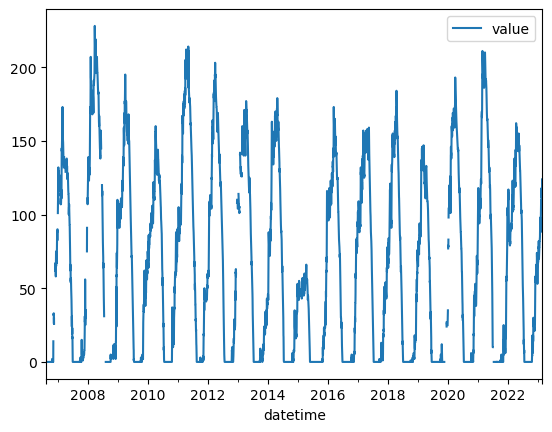

In [ ]:
values_df.plot();

In [ ]:
#Get number of decimal years between first and last observation
nyears = (values_df.index.max() - values_df.index.min()).days/365.25
nyears

16.522929500342233

### Compute the integer day of year (doy) and integer day of water year (dowy)
* Can get doy for each record with `df.index.dayofyear` assuming the index contains `Timestamp` objects
    * Add a new column to store these values
    * https://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DatetimeIndex.dayofyear.html
* For the day of water year calculation, you can offset the existing integer doy values so that Oct 1 = 1, then account for any values outside the expected range (e.g., less than 0, greater than 366)
    * https://en.wikipedia.org/wiki/Water_year
    * Add another column to store these values

In [ ]:
#Add DOY and DOWY column
#Need to revisit for leap year support
def add_dowy(df, col=None):
    if col is None:
        df['doy'] = df.index.dayofyear
    else:
        df['doy'] = df[col].dayofyear
    # Sept 30 is doy 273
    df['dowy'] = df['doy'] - 273
    df.loc[df['dowy'] <= 0, 'dowy'] += 365
    #df['dowy'] = (df['doy'].index - pd.DateOffset(months=9)).dayofyear

In [ ]:
#Add new columns
add_dowy(values_df)

In [ ]:
#Quick sanity check around beginning of WY, make sure Oct 1 = 1
values_df[f'{curr_y-1}-09-28':f'{curr_y-1}-10-03']

In [ ]:
#Quick sanity check for calendar year end/start values
values_df[f'{curr_y-1}-12-29':f'{curr_y}-01-03']

### Compute statistics for each day of water year, using values from all years
* Seems like a Pandas groupby/agg might work here
* Stats should at least include min, max, mean, and median

In [ ]:
stat_list = ['count','min','max','mean','std','median']

In [ ]:
doy_stats = values_df.groupby('dowy').agg(stat_list)['value']
doy_stats

/tmp/ipykernel_431/4116777492.py:1: FutureWarning: ['qualifiers', 'censor_code', 'date_time_utc'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  doy_stats = values_df.groupby('dowy').agg(stat_list)['value']


,count,min,max,mean,std,median
dowy,,,,,,
1,17,0.0,9.0,0.588235,2.181136,0.0
2,17,0.0,8.0,0.470588,1.940285,0.0
3,17,0.0,9.0,0.588235,2.181136,0.0
4,17,0.0,5.0,0.529412,1.328422,0.0
5,17,0.0,5.0,0.529412,1.374666,0.0
...,...,...,...,...,...,...
361,17,0.0,1.0,0.058824,0.242536,0.0
362,17,0.0,1.0,0.058824,0.242536,0.0
363,17,0.0,1.0,0.058824,0.242536,0.0


## Create a plot of these aggregated dowy values
* Your output independent variable (x-axis) should be day of water year (1-366), and dependent variable (y-axis) should be median value for that day of year, computed using aggregated values for all available years
    * You may have to explicitly specify the x and y valuese for your plot function
* Something like this 30-year mean and median plot here: https://www.nwrfc.noaa.gov/snow/plot_SWE.php?id=AFSW1
* Extra credit: add shaded regions for standard deviation or normalized median absolute deviation (nmad) for each doy to show spread in values over the full record (see `ax.fill_between`)
    * https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.fill_between.html

In [ ]:
#Student Exercise

## Add the daily snow depth values for the current water year
* Can use pandas `loc` indexing here with simple strings ('YYYY-MM-DD'), or Timestamp objects
    * Standard slicing also works with `:`
* Make sure to `dropna` to remove any records missing data
* Add this to your plot

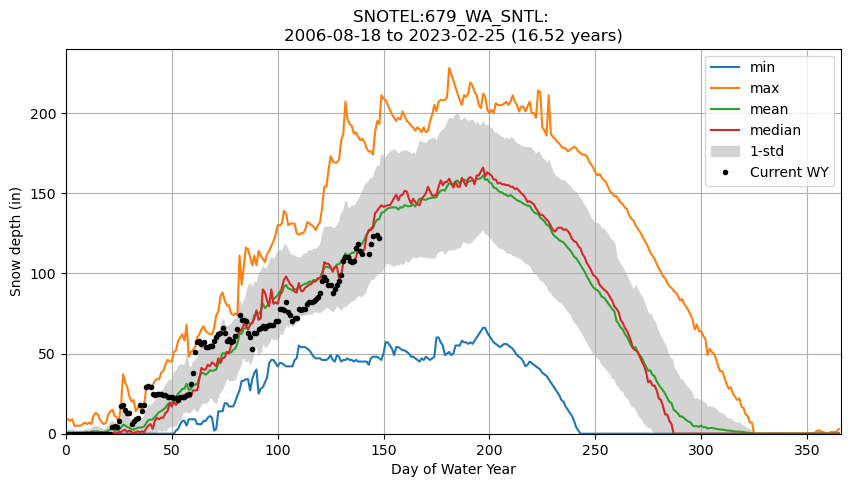

In [ ]:
#Student Exercise

### For most recent snow depth value in the record, what is the percentage of "normal"
* This will be the snow depth from Wednesday or whenever you ran the download script
* Normal can be defined by long-term median for the same dowy across all years at the site

In [ ]:
#Student Exercise

## Part 3: Western U.S. time series analysis

### Load pickled DataFrame for all sites

In [ ]:
snwd_df = pd.read_pickle(allsites_pkl_fn)

In [ ]:
snwd_df.shape

(14025, 806)

In [ ]:
snwd_df.head()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
datetime,,,,,,,,,,,,,,,,,,,,,
1984-10-01 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-05 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
snwd_df.describe()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
count,8971.000000,8909.000000,9660.000000,6833.000000,7954.000000,8193.000000,8365.000000,7139.000000,7197.000000,9711.000000,...,6349.000000,6461.000000,9104.000000,7864.000000,7533.000000,6920.000000,3863.000000,3879.000000,8272.000000,7284.000000
mean,9.815851,7.407790,24.913458,36.359579,27.014332,35.334798,5.964136,29.431013,15.439489,32.198126,...,9.114506,15.036372,34.276911,11.033698,10.453339,3.697688,10.476831,8.383346,18.256770,26.014690
std,14.651453,12.660844,23.422584,42.755263,26.955982,40.036953,9.399264,27.698495,19.887877,35.128416,...,11.477779,19.419041,36.237121,14.216598,12.869854,7.669382,14.125755,11.750906,20.047268,29.159213
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,22.000000,17.000000,21.000000,20.000000,0.000000,24.000000,0.000000,19.000000,...,3.000000,0.000000,25.000000,1.000000,4.000000,0.000000,0.000000,0.000000,10.000000,13.000000
75%,18.000000,12.000000,44.000000,69.000000,48.000000,67.000000,9.000000,55.000000,32.000000,60.000000,...,17.000000,31.000000,63.000000,22.000000,20.000000,3.000000,22.000000,17.000000,34.000000,51.000000
max,66.000000,70.000000,95.000000,175.000000,107.000000,162.000000,53.000000,106.000000,76.000000,144.000000,...,139.000000,75.000000,198.000000,64.000000,61.000000,56.000000,60.000000,55.000000,79.000000,111.000000


### Convert snow depth inches to cm
* Use these values for the remainder of the lab
* Careful about running this cell and applying multiple times!

In [ ]:
#Student Exercise

### Create a histogram of all snow depth values
* Use the Pandas `stack` function here, otherwise you will end up with histograms for each station
* Consider using log scale, as you likely have a spike for days with 0 snow depth (several months of each year!)

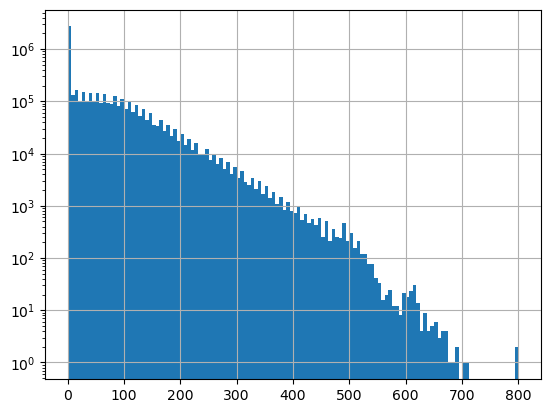

In [ ]:
f, ax = plt.subplots()
snwd_df.stack().hist(bins=128, ax=ax, log=True);

### Get the total count of operational stations on each day and plot
* x axis should be time and y axis should be number of stations
* This is the number of valid values (not NaN) for each row in the DataFrame
    * Hint: Remember the Pandas `count` function: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.count.html
    * Make sure do the count over the right `axis` of the DataFrame
* Thought question 🤔
    * *Can you identify years when a large number of new snow depth sensors were added to the network?*

## Part 4: Temporal correlation of snow depth for nearby stations 
* Can use Paradise ('SNOTEL:679_WA_SNTL') and nearby station identified on the labeled folium plot above
* Plot the time series from both stations
* Can also use dropna here, but careful about methodology (`any` vs `all`, vs `thresh`)
    * https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html

In [ ]:
#Highest site
#site1 = 'SNOTEL:863_WA_SNTL'
#site2 = 'SNOTEL:692_WA_SNTL'

In [ ]:
#Paradise and nearby sites
site1 = 'SNOTEL:679_WA_SNTL'
site2 = 'SNOTEL:1085_WA_SNTL'
site3 = 'SNOTEL:1257_WA_SNTL'
site4 = 'SNOTEL:941_WA_SNTL'
site5 = 'SNOTEL:642_WA_SNTL'

### Start with two nearby stations

In [ ]:
site_list = [site1,site2]
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_list))]

In [ ]:
snwd_df[site_list]

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
datetime,,
1984-10-01 00:00:00+00:00,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN
1984-10-05 00:00:00+00:00,NaN,NaN
...,...,...
2023-02-19 00:00:00+00:00,NaN,243.84
2023-02-20 00:00:00+00:00,284.48,246.38
2023-02-21 00:00:00+00:00,299.72,251.46


#### Limit to records where both have valid data
* This uses the handy Pandas `dropna` function
    * https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dropna.html
    * https://pandas.pydata.org/docs/user_guide/missing_data.html#missing-data

In [ ]:
snwd_df[site_list].dropna(thresh=2)

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
datetime,,
2006-10-05 00:00:00+00:00,0.00,0.00
2006-10-06 00:00:00+00:00,0.00,0.00
2006-10-07 00:00:00+00:00,0.00,0.00
2006-10-08 00:00:00+00:00,0.00,0.00
2006-10-09 00:00:00+00:00,0.00,0.00
...,...,...
2023-02-16 00:00:00+00:00,289.56,238.76
2023-02-17 00:00:00+00:00,284.48,238.76
2023-02-20 00:00:00+00:00,284.48,246.38


### Plot location and time series

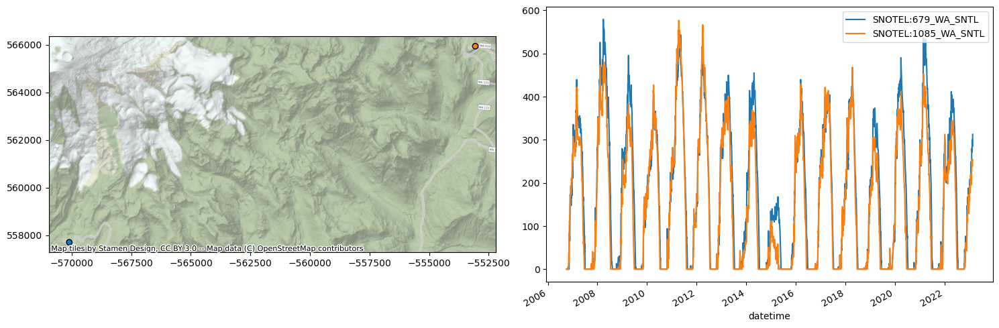

In [ ]:
f, axa = plt.subplots(1,2,figsize=(15,5))
sites_gdf_wa.loc[site_list].plot(facecolor=color_list, edgecolor='k', ax=axa[0])
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain, alpha=0.7)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1])
plt.tight_layout()

### Consider seasonal variability in snow depth evolution for the two sites
* Create a scatterplot showing snow depth from site 1 on the y axis and site 2 on the x axis, with color ramp representing DOWY
* The points should fall on the 1:1 line if the snow depth evolution was identical
* Consider a cyclical color ramp like 'twilight' here, so values of 1 and 365 will have similar color
* Take a moment to think about what this plot is showing 🤔 

#### Add doy and dowy columns

In [ ]:
#Add column for dowy
add_dowy(snwd_df)

In [ ]:
snwd_df[[*site_list,'dowy']].dropna(thresh=2)

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL,dowy
datetime,,,
2006-08-18 00:00:00+00:00,0.00,NaN,322
2006-08-19 00:00:00+00:00,0.00,NaN,323
2006-08-20 00:00:00+00:00,0.00,NaN,324
2006-08-21 00:00:00+00:00,0.00,NaN,325
2006-08-22 00:00:00+00:00,0.00,NaN,326
...,...,...,...
2023-02-19 00:00:00+00:00,NaN,243.84,142
2023-02-20 00:00:00+00:00,284.48,246.38,143
2023-02-21 00:00:00+00:00,299.72,251.46,144


In [ ]:
#Determine max values to use for axes limits
max_snwd = int(np.ceil(snwd_df[[*site_list]].dropna(thresh=2).max().max()))

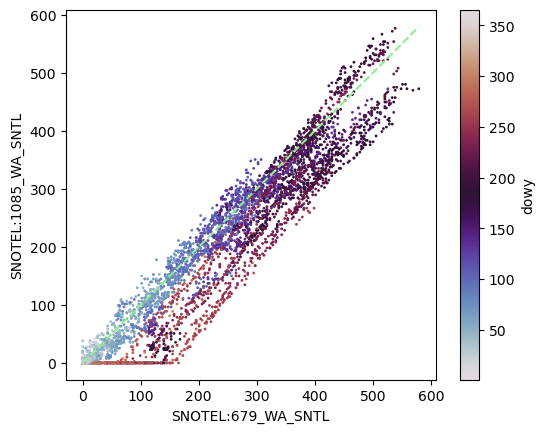

In [ ]:
f,ax = plt.subplots(dpi=100)
ax.set_aspect('equal')
snwd_df[[*site_list,'dowy']].dropna(thresh=2).plot.scatter(x=site1,y=site2,c='dowy',cmap='twilight', s=1,ax=ax);
ax.plot(range(0,max_snwd), range(0,max_snwd), color='lightgreen', ls='--');

🧑‍🏫 *Looks like 679 (x axis) has greater snow depth later in the season, compared to 1085 (y axis)*

## Determine Pearson's correlation coefficient for the two time series
* There are many strategies to considering spatial and temporal correlation
* One of the simplest is the Pearson correlation coefficient:
    * https://en.wikipedia.org/wiki/Pearson_correlation_coefficient
* See the Pandas `corr` method
    * https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html
    * This should properly handle nan under the hood!
* For other potential approaches (cross-correlation to consider time lag), this is a nice summary: https://towardsdatascience.com/four-ways-to-quantify-synchrony-between-time-series-data-b99136c4a9c9

In [ ]:
snwd_corr = snwd_df[site_list].corr()
snwd_corr

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
SNOTEL:679_WA_SNTL,1.000000,0.969551
SNOTEL:1085_WA_SNTL,0.969551,1.000000


🧑‍🏫 *As expected, these two records are highly correlated!*

### Now repeat for several nearby sites

In [ ]:
site_list = [site1,site2,site3,site4,site5]
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_list))]

In [ ]:
mygdf = sites_gdf_wa.loc[site_list]
mygdf

,code,name,network,elevation_m,county,state,pos_accuracy_m,beginDate,endDate,HUC,HUD,TimeZone,actonId,shefId,stationTriplet,isActive,HUC2,HUC6,geometry
index,,,,,,,,,,,,,,,,,,,
SNOTEL:679_WA_SNTL,679_WA_SNTL,Paradise,SNOTEL,1563.624023,Pierce,Washington,0,10/1/1979 12:00:00 AM,1/1/2100 12:00:00 AM,171100150104,17110015,-8.0,21C35S,AFSW1,679:WA:SNTL,True,17,171100,POINT (-570102.829 557709.249)
SNOTEL:1085_WA_SNTL,1085_WA_SNTL,Cayuse Pass,SNOTEL,1597.151978,Pierce,Washington,0,10/1/2006 12:00:00 AM,1/1/2100 12:00:00 AM,171100140301,17080004,-8.0,21C41S,CAYW1,1085:WA:SNTL,True,17,171100,POINT (-553060.628 565941.972)
SNOTEL:1257_WA_SNTL,1257_WA_SNTL,Skate Creek,SNOTEL,1149.095947,Lewis,Washington,0,10/15/2014 12:00:00 PM,1/1/2100 12:00:00 AM,170800040505,,-8.0,21C43S,SKTW1,1257:WA:SNTL,True,17,170800,POINT (-577759.243 542830.006)
SNOTEL:941_WA_SNTL,941_WA_SNTL,Mowich,SNOTEL,963.168030,Pierce,Washington,0,9/30/1998 12:00:00 AM,1/1/2100 12:00:00 AM,171100140105,17110014,-8.0,21C40S,MHSW1,941:WA:SNTL,True,17,171100,POINT (-584219.828 575219.336)
SNOTEL:642_WA_SNTL,642_WA_SNTL,Morse Lake,SNOTEL,1648.968018,Yakima,Washington,0,10/1/1978 12:00:00 AM,1/1/2100 12:00:00 AM,170300020106,17030002,-8.0,21C17S,MRSW1,642:WA:SNTL,True,17,170300,POINT (-548802.595 569633.965)


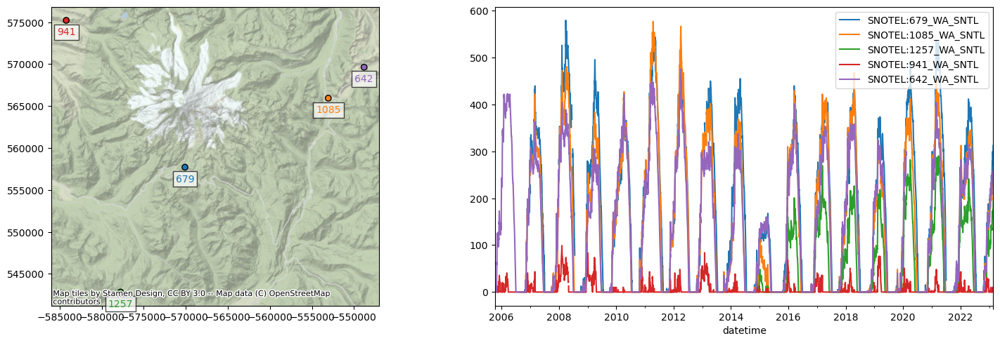

In [ ]:
f, axa = plt.subplots(1,2,figsize=(15,5))

#Plot the points on a map
mygdf.plot(facecolor=color_list, edgecolor='k', ax=axa[0])
#Prepare list of tuples of (x,y,label,color) to use for annotation labels
annotation_tuples = zip(mygdf['geometry'].x, mygdf['geometry'].y, mygdf['code'].str.split('_').str[0], color_list)
#Loop through the tuples and add annotations to the map
for x, y, label, c in annotation_tuples:
    axa[0].annotate(label, xy=(x,y), xytext=(0, -15), ha='center', textcoords="offset points", color=c, \
                    bbox=dict(boxstyle="square",fc='w',alpha=0.7))
#Add the basemap
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, source=ctx.providers.Stamen.Terrain, alpha=0.7)

#Plot the time series
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1])
#snwd_df[site_list].dropna(how='all').plot(ax=axa[1])
plt.tight_layout()

In [ ]:
#The Pandas `corr` should properly handle nans
snwd_corr = snwd_df[site_list].corr()
snwd_corr

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL,SNOTEL:1257_WA_SNTL,SNOTEL:941_WA_SNTL,SNOTEL:642_WA_SNTL
SNOTEL:679_WA_SNTL,1.000000,0.969551,0.910380,0.412699,0.953264
SNOTEL:1085_WA_SNTL,0.969551,1.000000,0.941058,0.411654,0.978121
SNOTEL:1257_WA_SNTL,0.910380,0.941058,1.000000,0.467872,0.913422
SNOTEL:941_WA_SNTL,0.412699,0.411654,0.467872,1.000000,0.399571
SNOTEL:642_WA_SNTL,0.953264,0.978121,0.913422,0.399571,1.000000


### Visualize correlation values for different combinations of stations

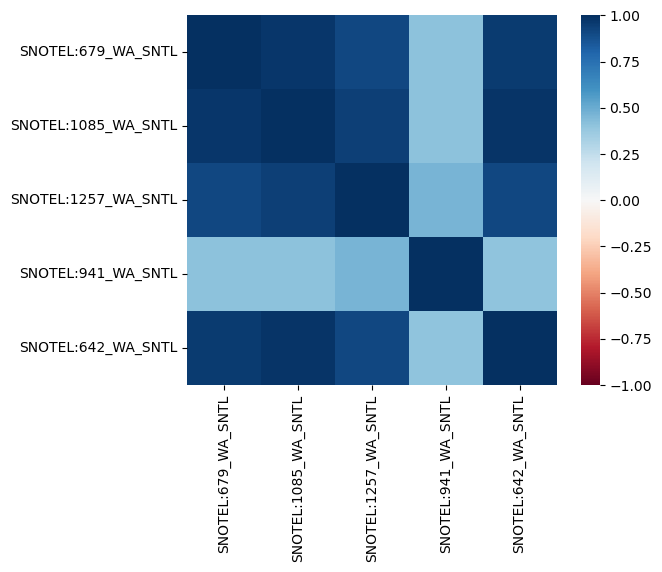

In [ ]:
import seaborn as sns
sns.heatmap(snwd_corr, cmap='RdBu', vmin=-1, vmax=1, square=True);
#Not sure why 0.5 values are not identical color?
#snwd_corr.style.background_gradient(cmap='RdBu').set_precision(2)

### Extra Credit: Consider spatial variability of these correlation coefficients
* Select a reference station
* Compute correlation scores with this reference station
    * Join the correlation score values with original GeoDataFrame containing Point geometries
* Create a scatter plot (map) with color ramp showing correlation score

In [ ]:
#Student Exercise

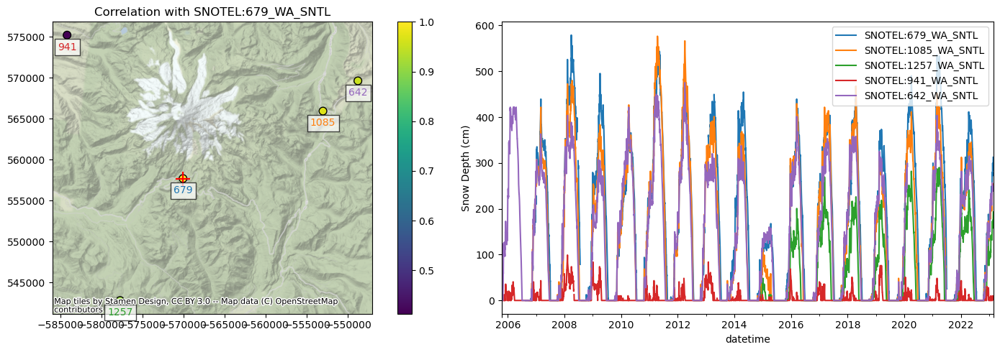

In [ ]:
#Student Exercise

### Extra Credit: Consider the correlation as a function of distance from the reference station
* Compute the distance in km between the reference station and all other stations
* Create a plot of correlation coefficient vs. distance

In [ ]:
#Student Exercise

## Extra Credit: Correlation for all SNOTEL sites across Western U.S.

Let's expand to compute correlation between the reference station and all other sites, instead of just the nearest sites above
* https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corrwith.html
* Consider correlation vs. distance
* Consider correlation vs. elevation (relative to ref station elevation)

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

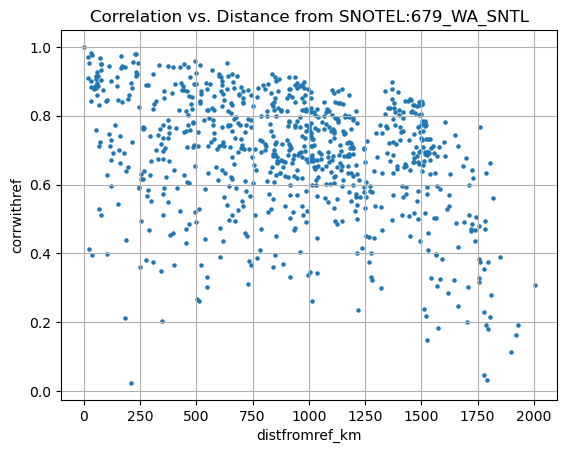

In [ ]:
#Student Exercise

#Student Exercise

In [ ]:
#Student Exercise

#Student Exercise

In [ ]:
#Student Exercise

### Create a map to consider spatial variability in correlation

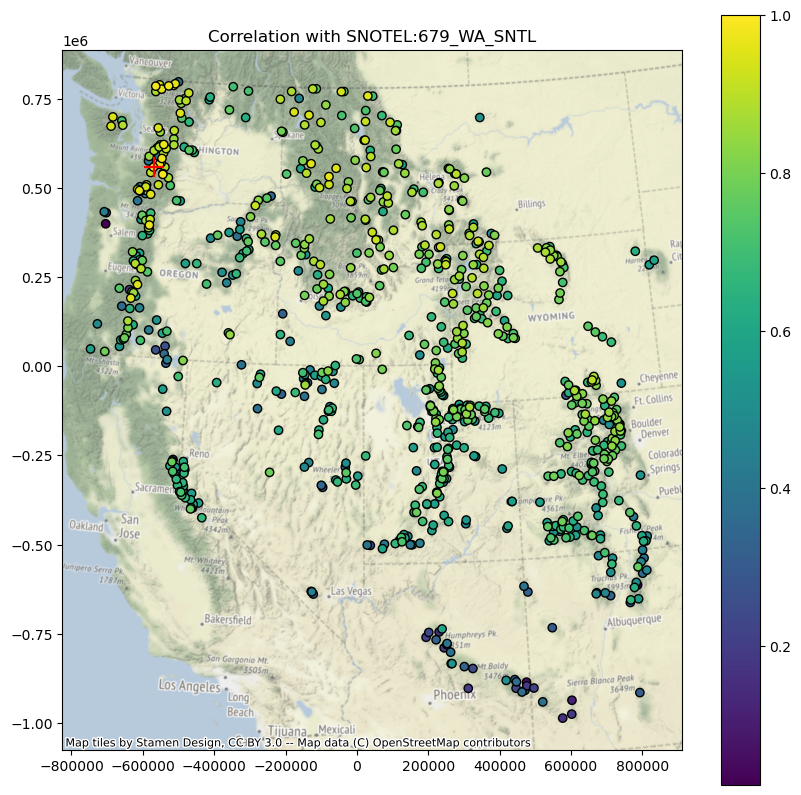

In [ ]:
#Student Exercise

## Part 6: Compute daily snow depth difference for all stations
* Compute the daily change (difference from one day to the next)
* This represents daily snow accumulation or ablation
* See the Pandas `diff` function: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.diff.html
    * Make sure you specify the axis properly to difference over time (not station to station), and sanity check
    * This should correctly account for missing values, but need to double-check
* Sanity check with `tail` - most values should be relatively small (+/-1-6 cm)

In [ ]:
#Student Exercise

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL,doy,dowy
datetime,,,,,,,,,,,,,,,,,,,,,
2023-02-19 00:00:00+00:00,0.00,-2.54,0.00,NaN,0.00,-2.54,0.00,0.00,0.00,-7.62,...,-5.08,0.00,5.08,-2.54,-2.54,-2.54,0.00,-2.54,1.0,1.0
2023-02-20 00:00:00+00:00,-2.54,-2.54,-2.54,15.24,2.54,-2.54,0.00,5.08,0.00,5.08,...,0.00,10.16,2.54,-5.08,0.00,-2.54,5.08,12.70,1.0,1.0
2023-02-21 00:00:00+00:00,-2.54,-2.54,-2.54,5.08,-2.54,-5.08,5.08,-2.54,-2.54,2.54,...,-5.08,22.86,17.78,-7.62,0.00,-2.54,12.70,0.00,1.0,1.0
2023-02-22 00:00:00+00:00,0.00,2.54,17.78,NaN,2.54,25.40,-10.16,NaN,20.32,12.70,...,0.00,7.62,5.08,-5.08,12.70,-2.54,10.16,5.08,1.0,1.0
2023-02-23 00:00:00+00:00,10.16,15.24,-2.54,NaN,0.00,17.78,5.08,NaN,2.54,5.08,...,30.48,-2.54,-5.08,10.16,2.54,17.78,-2.54,7.62,1.0,1.0


In [ ]:
snwd_df_diff.drop(['doy','dowy'], axis=1).dropna(how='all')

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
datetime,,,,,,,,,,,,,,,,,,,,,
1984-10-02 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1985-03-11 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1985-04-10 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-19 00:00:00+00:00,0.00,-2.54,0.00,NaN,0.00,-2.54,0.00,0.00,0.00,-7.62,...,-2.54,-2.54,-5.08,0.00,5.08,-2.54,-2.54,-2.54,0.00,-2.54
2023-02-20 00:00:00+00:00,-2.54,-2.54,-2.54,15.24,2.54,-2.54,0.00,5.08,0.00,5.08,...,2.54,2.54,0.00,10.16,2.54,-5.08,0.00,-2.54,5.08,12.70
2023-02-21 00:00:00+00:00,-2.54,-2.54,-2.54,5.08,-2.54,-5.08,5.08,-2.54,-2.54,2.54,...,2.54,-2.54,-5.08,22.86,17.78,-7.62,0.00,-2.54,12.70,0.00


### Create plot showing this daily accumulation for all sites
* Can start by trying to plot a subset of sites - every 10th, for example (`snwd_df_diff.iloc[:, ::10].plot()`)
    * May require a few minutes to plot all ~800 sites
* Adjusting the ylim appropriately
* Probably best to set `legend=False` in your plot call
* Add a black horizontal line at 0 with linewidth=0.5

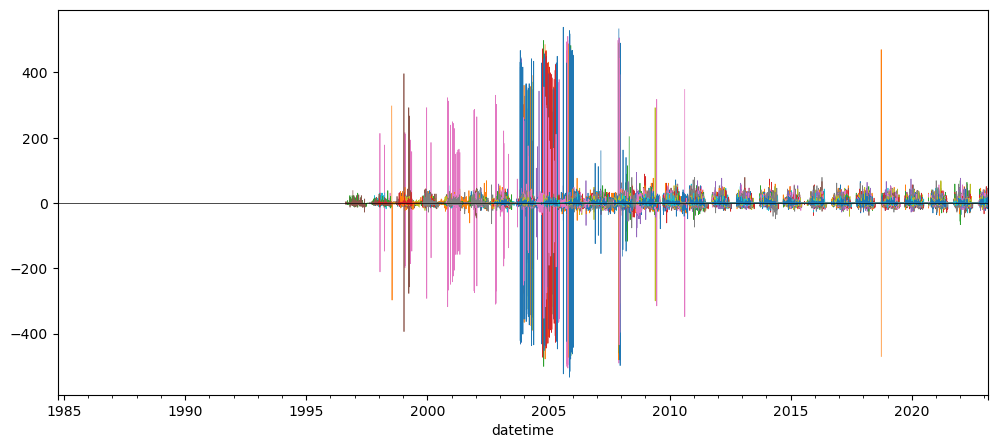

In [ ]:
f,ax = plt.subplots(figsize=(12,5))
snwd_df_diff.iloc[:, ::10].plot(ax=ax,legend=False, lw=0.5)
ax.axhline(0, color='k', lw=0.5);

### Interpretation (Provide brief written response these questions) ✍️
* Do you think you can confidently identify large snow accumulation events using these difference values?
* Are some periods or sensors noisier than others?
* When the measured snow depth increases from one day to the next, what happened?
* When the measured snow depth decreases from one day to the next, what happened?
    * Hint: during the winter, some days never get above freezing, but snow depths still decrease...

## Extra Credit: Design filters to remove artifacts and outliers
* Could likely design a series of filters to remove outliers from original snow depth value time series and the difference time series for each site
* One idea:
    * What is the maximum amount of snowfall you would expect in a 24-hour period? 
    * How about the maximum decrease in snow depth in a 24-hour period?
* Can also combine multiple stations for another round of filters:
    * If a single station shows an increase of 2 m, but all others show a decrease, is that realistic?
* Other considerations:
    * mean +/- (3 * std) is often used to remove outliers from normally distributed values (but is this the case for your difference values?)
    * Z-score threshold (same idea): https://www.geeksforgeeks.org/z-score-for-outlier-detection-python/
* Maybe come back to this if you have time later, for now, just note the presence of measurement errors

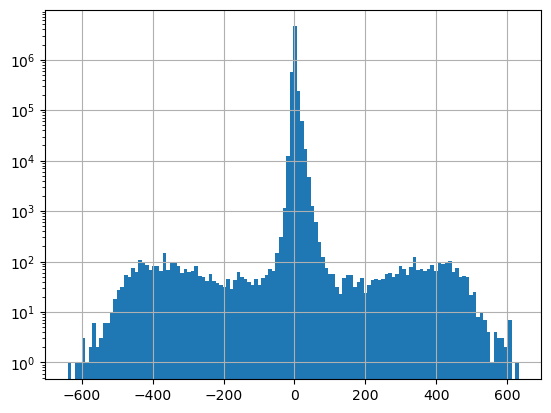

In [ ]:
f, ax = plt.subplots()
snwd_df_diff.stack().hist(bins=128, ax=ax, log=True);

In [ ]:
snwd_df_diff.count().sum()

5480962

In [ ]:
#Mean and std for entire dataset before filtering
print(np.nanmean(snwd_df_diff.values), np.nanstd(snwd_df_diff.values))

0.011558532972861331 11.497508328306711


In [ ]:
#Assume maximum daily increase due to snowfall of 1.7 m
max_diff = 170
idx = snwd_df_diff > max_diff
#Assume maximum daily decrease due to melting/compaction of 0.7 m
min_diff = -70
idx = idx | (snwd_df_diff < min_diff)
snwd_df_diff[idx] = np.nan

In [ ]:
snwd_df_diff.count().sum()

5476141

In [ ]:
f=3
#Mean and std for entire dataset
print(np.nanmean(snwd_df_diff.values), np.nanstd(snwd_df_diff.values))

0.022227334906095374 4.936164492273886


In [ ]:
snwd_df_diff.mean().mean()

0.02126352446971767

In [ ]:
snwd_df_diff.std().mean()

4.620154110674991

#### Consider removing outliers based on stats for each site

In [ ]:
#Mean and std for each site
#idx = (snwd_df_diff - snwd_df_diff.mean()).abs().gt(f*snwd_df_diff.std())
#snwd_df_diff[idx] = np.nan

In [ ]:
snwd_df_diff.median(axis=1).max()

15.240000000000009

In [ ]:
snwd_df_diff.count().sum()

5476141

#### Plot the filtered difference values

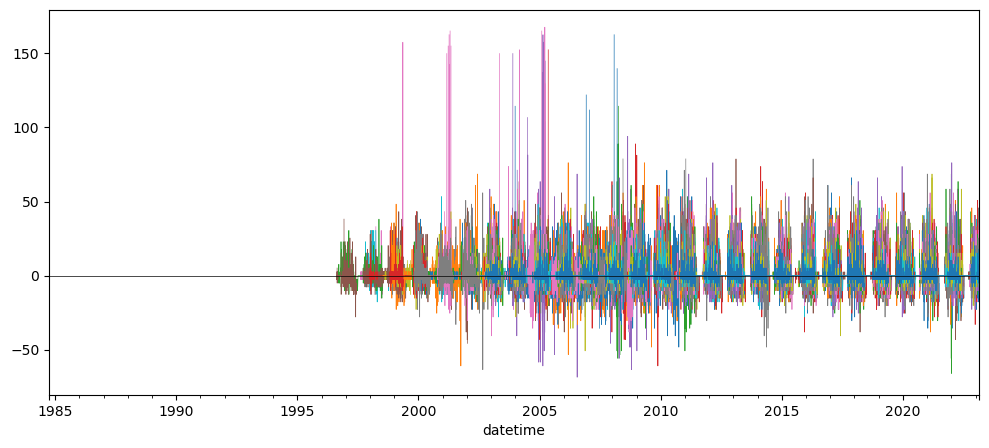

In [ ]:
f,ax = plt.subplots(figsize=(12,5))
snwd_df_diff.iloc[:,::10].plot(ax=ax,legend=False, lw=0.5)
ax.axhline(0, color='k', lw=0.5);

*Better!  But still some outliers that can be removed with improved filters...*

## For now, let's aggregate across all stations using robust statistics
* Create a plot showing the median difference values across all stations for all days in the record with valid data
    * Again, careful about which axis along which you're computing the median
* You may need to adjust the ylim to bring out detail if you haven't removed outliers

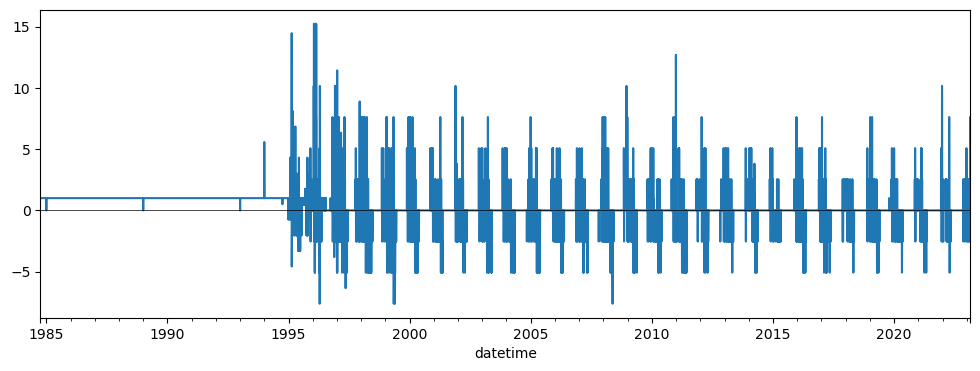

In [ ]:
#Student Exercise

### Create a similar plot, but limit to current water year
* Starting Oct 1 of previous calendar year
* Can you identify any big snow events?  
* I added shading to show spread of values (+/-nmad), but this is optional
    * Can apply this function to the values along axis 1: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.median_abs_deviation.html
    * Make sure to pass `scale='normal'` to normalize these values so the nmad is consistent with std for a normal distribution

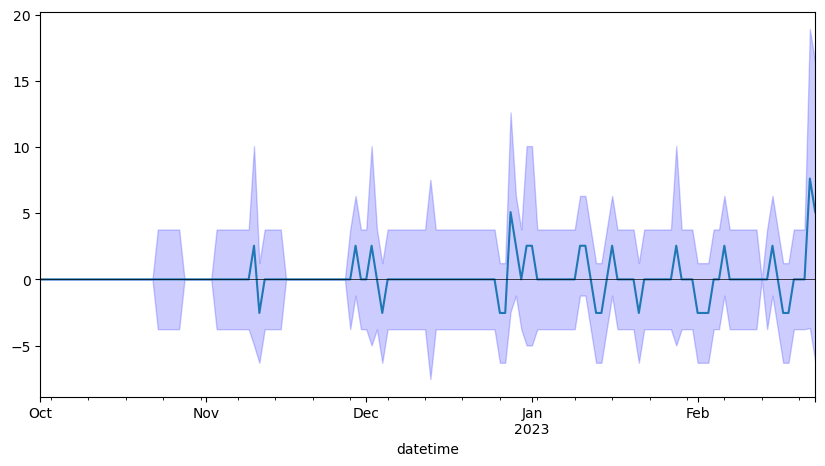

In [ ]:
#Student Exercise

### Now plot just the WA stations (use the `wa_stations` index we already calculated)
* Can do this with `snwd_df_diff.loc[:,wa_stations]`
    * Note: some stations we identified earlier may be missing from the larger time series data frame!
    * Can remove those as shown below
* What date had the greatest daily snow accumulation across all stations in WA? ✍️
    * May be useful to plot using `%matplotlib widget` or `hvplot()` for interactive tooltips to show dates as you hover over peaks

In [ ]:
print(wa_stations.shape)
wa_stations = wa_stations[wa_stations.isin(snwd_df_diff.columns)]
print(wa_stations.shape)

(84,)
(75,)


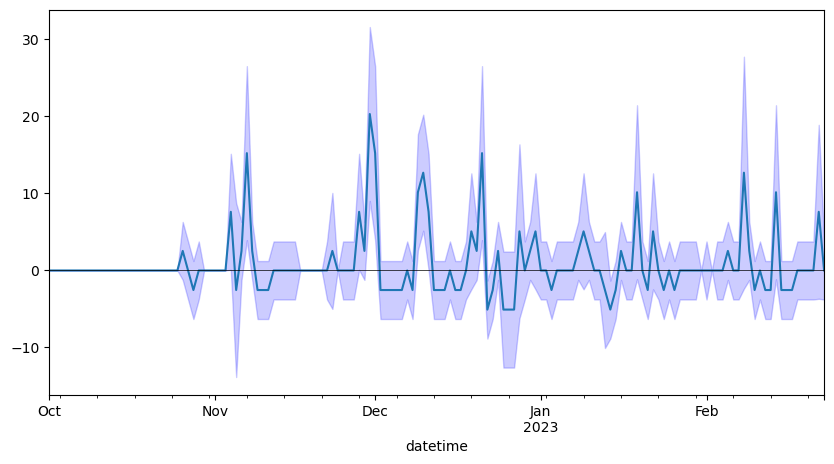

In [ ]:
#Student Exercise

### Extra Credit: Repeat for WA high elevation sites (defined earlier)
* Do you notice a difference?

In [ ]:
#Student Exercise

## Part 7: Compute statistics for all time series at all SNOTEL sites, plot and evaluate spatial variability
* So, now we're going back to our GeoDataFrame containing Point geometry for all sites, and adding some key metrics

In [ ]:
#Define a list to store our new column names
col_list = []

In [ ]:
#Define the GeoDataFrame to use (projected sites)
#We will append columns to this dataframe using new calculated values for all sites
gdf = sites_gdf_all_proj

### Compute the count of valid daily records (not NaN) available for each station
* Which station has the greatest number of observations for SNWD_D?

In [ ]:
snwd_df.drop(columns=['doy','dowy']).count(axis=0).sort_values().tail()

SNOTEL:306_ID_SNTL     9711
SNOTEL:570_NV_SNTL     9719
SNOTEL:651_OR_SNTL     9724
SNOTEL:763_UT_SNTL     9954
SNOTEL:347_MT_SNTL    10664
dtype: int64

### Add the count of valid time series records for each station a new column in our original WA SNOTEL sites GeoDataframe (the one containing lat/lon and other site attributes)
* Should be straightforward, let Pandas do the work to match site index values
* Verify your site DataFrame now has a 'Total Observation Count (days)' column

In [ ]:
col = 'Total Observation Count (days)'
gdf[col] = snwd_df.count(axis=0)
col_list.append(col)
gdf.head()

,code,name,network,elevation_m,county,state,pos_accuracy_m,beginDate,endDate,HUC,...,TimeZone,actonId,shefId,stationTriplet,isActive,HUC2,HUC6,geometry,corrwithref,Total Observation Count (days)
index,,,,,,,,,,,,,,,,,,,,,
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,Modoc,California,0,10/1/1983 12:00:00 AM,1/1/2100 12:00:00 AM,180200021403,...,-8.0,20H13S,ADMC1,301:CA:SNTL,True,18,180200,POINT (-544242.606 -64533.121),0.564425,8971.0
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,Kane,Utah,0,10/1/1994 12:00:00 AM,1/1/2100 12:00:00 AM,160300020301,...,-8.0,12M26S,AGUU1,907:UT:SNTL,True,16,160300,POINT (176554.295 -496466.990),0.445725,8909.0
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,Madison,Montana,0,9/1/1996 12:00:00 AM,1/1/2100 12:00:00 AM,100200050701,...,-8.0,11D28S,ABRM8,916:MT:SNTL,True,10,100200,POINT (179938.808 403391.205),0.853576,9660.0
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,King,Washington,0,9/1/1994 12:00:00 AM,1/1/2100 12:00:00 AM,171100100501,...,-8.0,21B48S,APSW1,908:WA:SNTL,True,17,171100,POINT (-556800.380 667749.727),0.943696,6833.0
SNOTEL:302_OR_SNTL,302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,Wallowa,Oregon,0,10/1/1980 12:00:00 AM,1/1/2100 12:00:00 AM,170601050101,...,-8.0,17D02S,ANRO3,302:OR:SNTL,True,17,170601,POINT (-228997.265 362101.867),0.940522,7954.0


## Your Turn! Calculate at least 3 of the following metrics
#### Extra credit: Try all of them!

### Add a column for the long-term max snow depth for each site

In [ ]:
#Student Exercise

### Add a column for the long-term mean snow depth at each site
* Note: to calculate this properly, probably want to remove any values near 0 (when there is no snow on the ground) before computing the mean
    * Maybe a threshold of 1 cm?

In [ ]:
#Student Exercise

### Add a column for the daily difference (snow accumulation) at all sites for a recent storm event
* Note, Pandas uses a `Timestamp` object that wraps the commond Python `datetime` objects
* pd.Timestamp('YYYY-MM-DD')
* Note, you may need to use `mydataframe.loc[pd.Timestamp('YYYY-MM-DD')]`

In [ ]:
#Student Exercise

### Add a column for the current snow depth for a recent day (say, yesterday) in the time series
* Use a relative index value here to get the latest Timestamp (like -1, or maybe -2)
    * Note that using timestamp for today could have limited returns, as latest data from some stations have not been integrated into database
* Note that the index is not a string, it is a Pandas Timestamp object: `pd.Timestamp('2019-02-06 00:00:00')`

In [ ]:
#Student Exercise

### Add a column for the percent of "normal" snow depth for most recent day
* We did this earlier for a single site
* Need to figure out the doy for the most recent day
* For all sites, compute the long-term median snow depth on that particular doy
* For all sites, compute the ratio of the current value compared to the long-term median

In [ ]:
#Student Exercise

### Add a column for _total_ snow accumulation in the past week
* Use a slice of pandas Timestamps to index
    * Can define using today's Timestamp and then calculate the timestamp from 7 days ago by subtracting a Timedelta object that you create
* You'll want to only include the days with positive snow accumulation (excluding days where no new snow fell or snow depth decreased)
    * Can then compute a sum

In [ ]:
#Student Exercise

In [ ]:
col_list

['Total Observation Count (days)',
 'Long-term Max Snow Depth (cm)',
 'Long-term Mean Snow Depth (cm)',
 '2021-12-12 Storm Accumulation (cm)',
 'Current snow depth (2023-02-23)',
 '2023-02-23 Percent of Normal Snow Depth',
 'Total Accumulation in last week (cm)']

In [ ]:
gdf

,code,name,network,elevation_m,county,state,pos_accuracy_m,beginDate,endDate,HUC,...,HUC6,geometry,corrwithref,Total Observation Count (days),Long-term Max Snow Depth (cm),Long-term Mean Snow Depth (cm),2021-12-12 Storm Accumulation (cm),Current snow depth (2023-02-23),2023-02-23 Percent of Normal Snow Depth,Total Accumulation in last week (cm)
index,,,,,,,,,,,,,,,,,,,,,
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,Modoc,California,0,10/1/1983 12:00:00 AM,1/1/2100 12:00:00 AM,180200021403,...,180200,POINT (-544242.606 -64533.121),0.564425,8971.0,167.64,54.222381,0.00,111.76,133.333333,0.0
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,Kane,Utah,0,10/1/1994 12:00:00 AM,1/1/2100 12:00:00 AM,160300020301,...,160300,POINT (176554.295 -496466.990),0.445725,8909.0,177.80,47.259611,-2.54,96.52,165.217391,0.0
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,Madison,Montana,0,9/1/1996 12:00:00 AM,1/1/2100 12:00:00 AM,100200050701,...,100200,POINT (179938.808 403391.205),0.853576,9660.0,241.30,92.227906,2.54,132.08,108.333333,0.0
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,King,Washington,0,9/1/1994 12:00:00 AM,1/1/2100 12:00:00 AM,171100100501,...,171100,POINT (-556800.380 667749.727),0.943696,6833.0,444.50,153.316399,5.08,231.14,102.247191,0.0
SNOTEL:302_OR_SNTL,302_OR_SNTL,Aneroid Lake #2,SNOTEL,2255.520020,Wallowa,Oregon,0,10/1/1980 12:00:00 AM,1/1/2100 12:00:00 AM,170601050101,...,170601,POINT (-228997.265 362101.867),0.940522,7954.0,271.78,101.861680,15.24,142.24,103.703704,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SNOTEL:877_AZ_SNTL,877_AZ_SNTL,Workman Creek,SNOTEL,2103.120117,Gila,Arizona,0,12/1/1938 12:00:00 AM,1/1/2100 12:00:00 AM,150601030802,...,150601,POINT (312068.679 -903127.365),0.200906,6920.0,142.24,24.863627,0.00,58.42,328.571429,0.0
SNOTEL:1228_UT_SNTL,1228_UT_SNTL,Wrigley Creek,SNOTEL,2842.869629,Sanpete,Utah,0,10/1/2012 12:00:00 AM,1/1/2100 12:00:00 AM,140600090303,...,140600,POINT (251223.755 -315239.244),0.599756,3863.0,152.40,54.767651,-5.08,114.30,132.352941,0.0
SNOTEL:1197_UT_SNTL,1197_UT_SNTL,Yankee Reservoir,SNOTEL,2649.321533,Iron,Utah,0,10/1/2012 12:00:00 AM,1/1/2100 12:00:00 AM,160300060202,...,160300,POINT (131625.749 -472292.611),0.578282,3879.0,139.70,46.744912,-5.08,104.14,128.125000,0.0


In [ ]:
gdf['2023-02-23 Percent of Normal Snow Depth'].max()

inf

## Create some scatterplots to review these new metrics
* Hint: remove NaN records on the fly before plotting - see the `dropna()` method
    * Best to apply after isolating the column you want to plot, consider `mydataframe[['max', 'geometry]].dropna().plot(column='max', ...)`
* Can plot separately, or create a figure with multiple subplots, and add titles/labels appropriately
* I create a function to create the plot, and then looped over each column name I wanted to plot

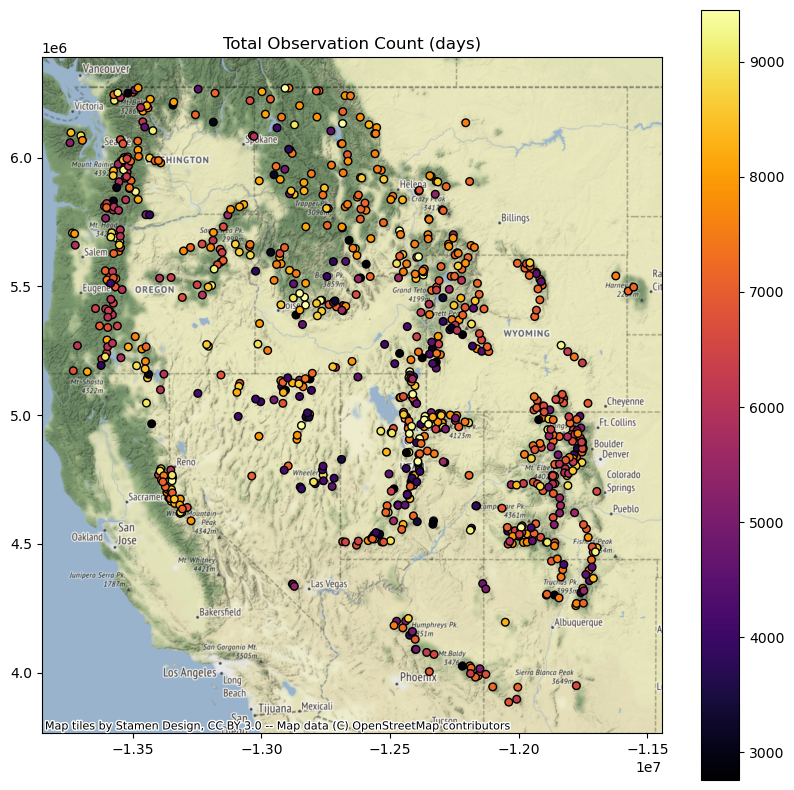

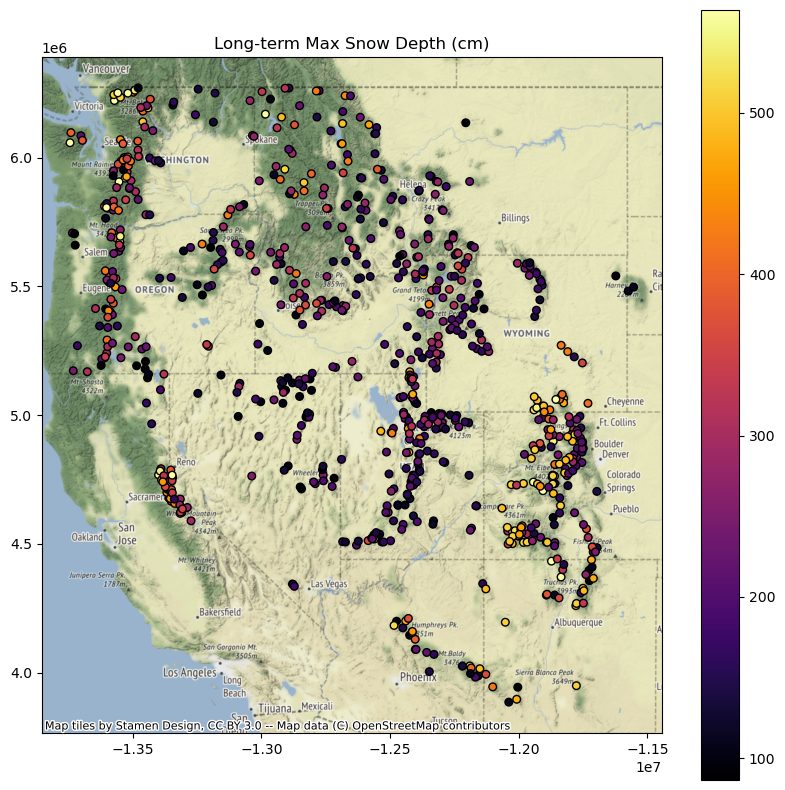

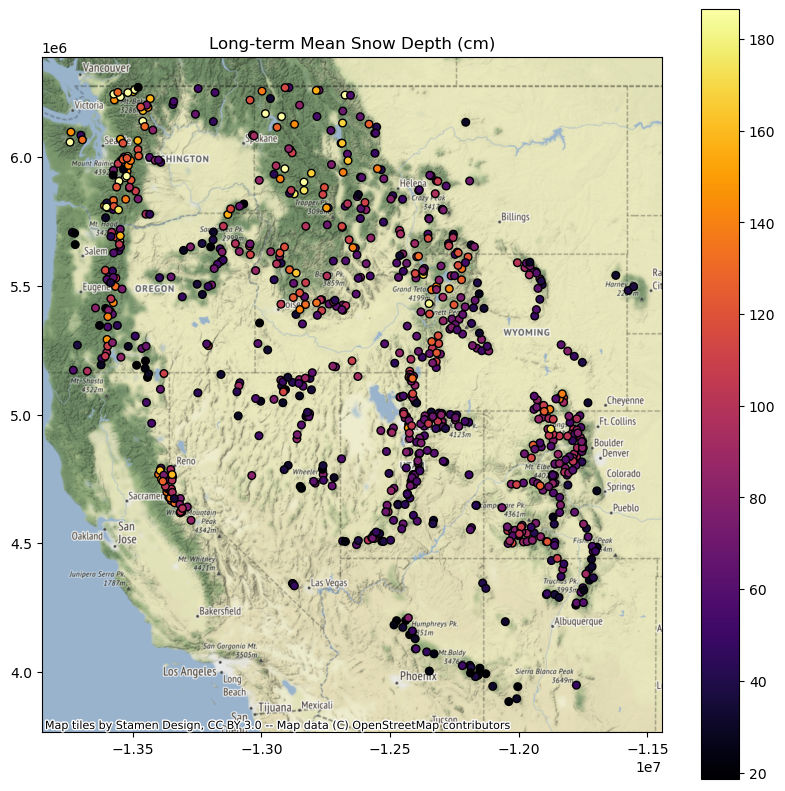

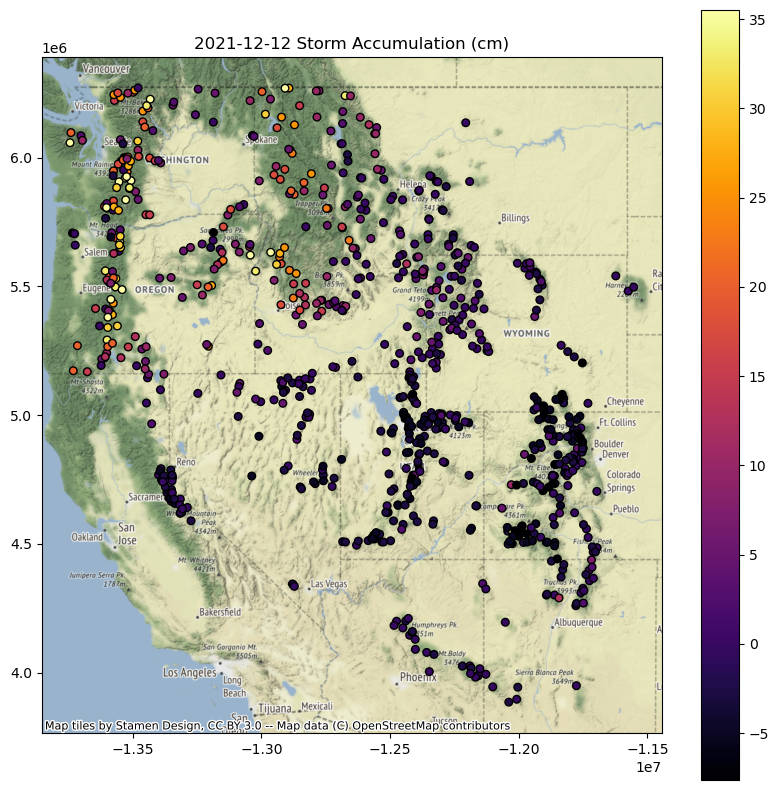

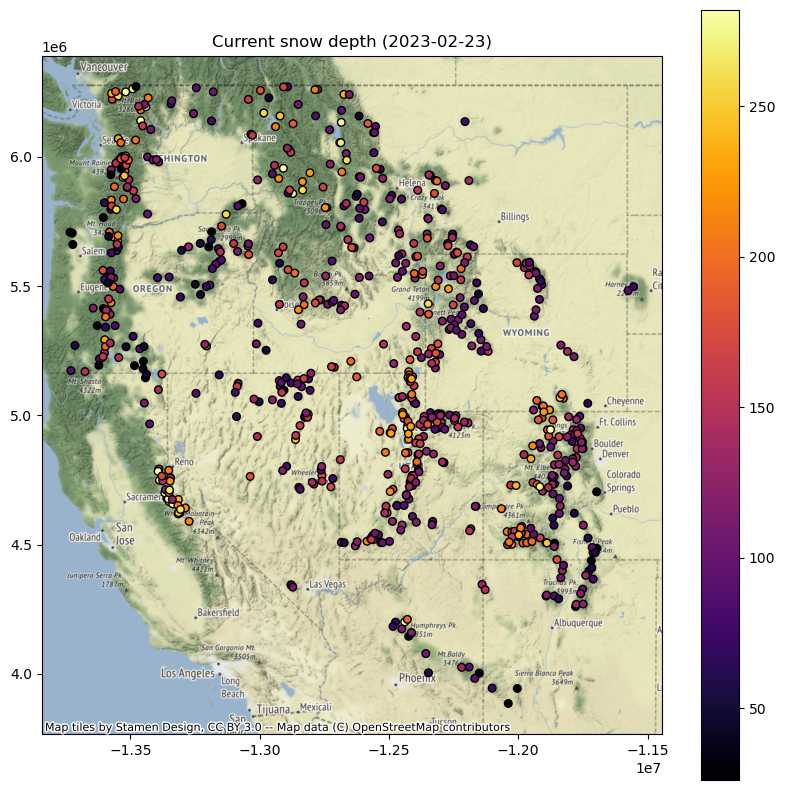

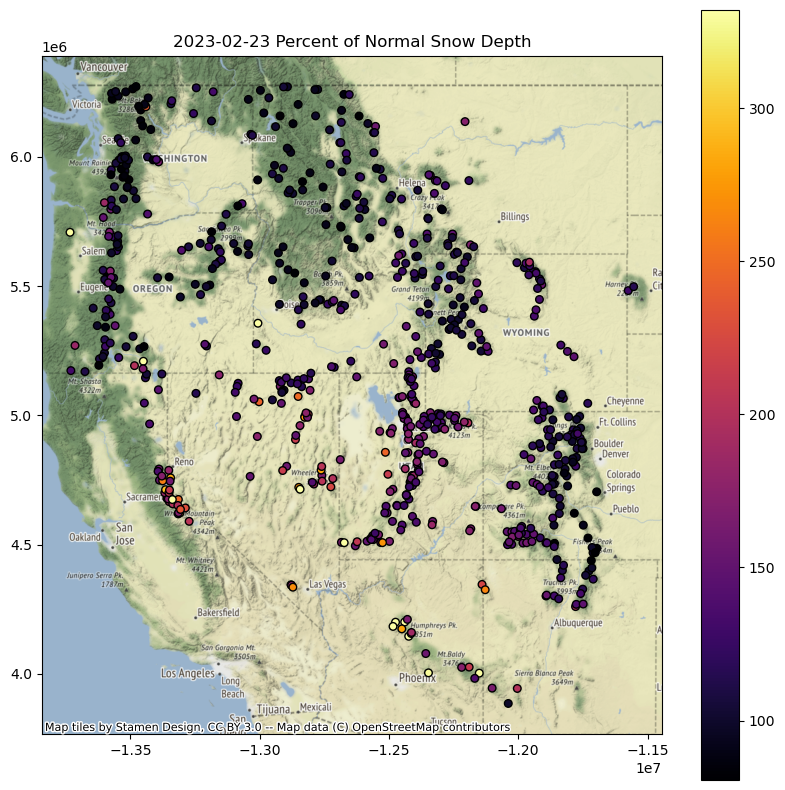

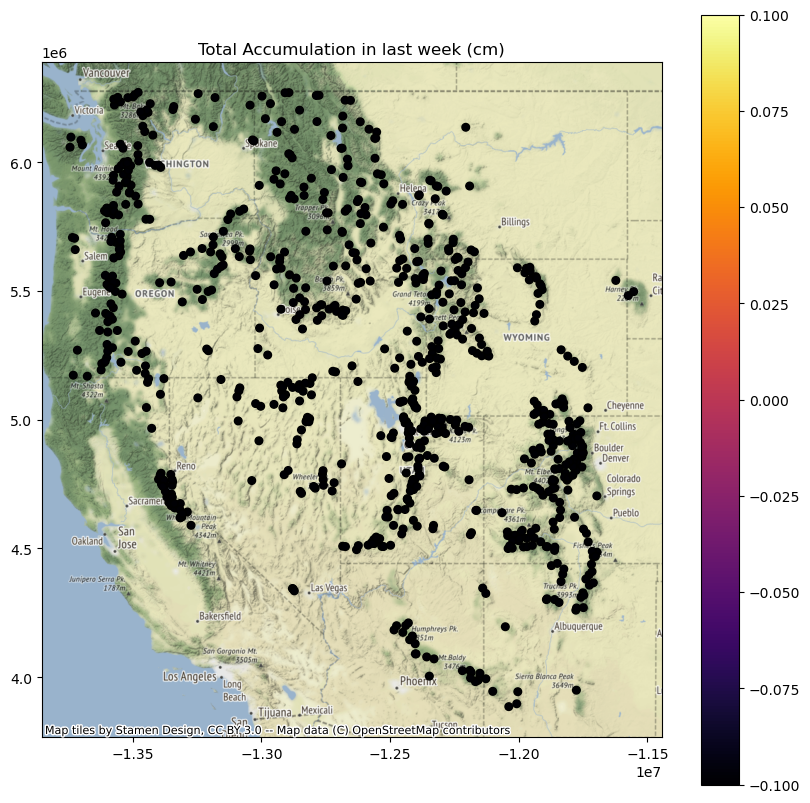

In [ ]:
for col in col_list:
    f, ax = plt.subplots(figsize=(10,10))
    ax.set_title(col)
    vmin, vmax = gdf[col].quantile((0.02, 0.98))
    kwargs = {'vmin':vmin, 'vmax':vmax, 'markersize':30, 'edgecolor':'k', 'cmap':'inferno', 'legend':True}
    gdf[[col, 'geometry']].to_crs('EPSG:3857').dropna().plot(ax=ax, column=col, **kwargs)
    ctx.add_basemap(ax=ax, source=ctx.providers.Stamen.Terrain)

## Replot percent of normal (descending sort)
* Plotting order can be important when you have larger markers that overlap - you can end up with very different interpretations depending on values displayed on top of the plot
* Let's explorer this by reviewing the "percent of normal snow depth" plot with ascending and descending order
* This should be pretty straightforward to sort and plot
    * `gdf.to_crs('EPSG:3857')[[col, 'geometry']].dropna().sort_values(by=col, ascending=False).plot()`
    * Need to set the column name appropriately

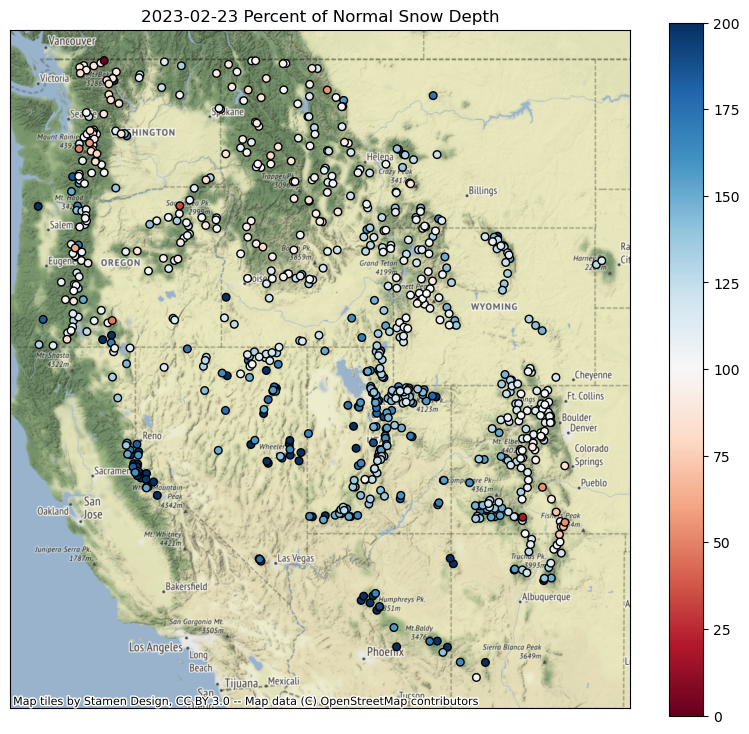

In [ ]:
#Student Exercise

## Replot percent of normal (ascending sort)

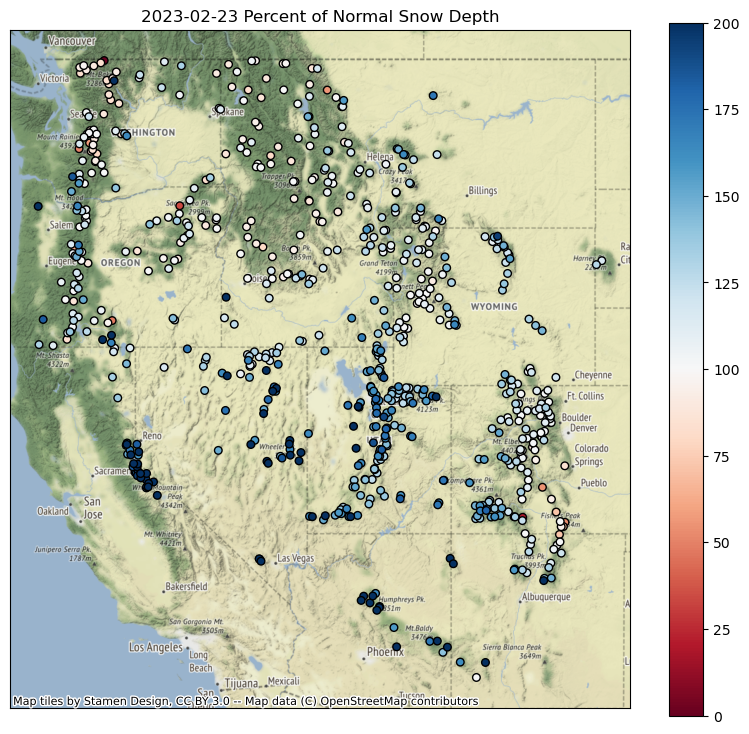

In [ ]:
#Student Exercise

*Note: plotting order can be important, leading to different interpreations! For example, compare values over the Sierra Nevada in CA in the above two plots.*

## Can you identify the SNOTEL site with: ✍️
* Greatest long-term maximum snow depth
    * *Are we sure that this is the absolute true maximum?* *What happens if the snow gets higher than the instrument?*
* Greatest (apparent) accumulation in past week
    * *Where should I go skiing this weekend if I like deep snow?*
    * Note: there can be some problematic sensor readings that made it through the quality control checks and our earlier filters

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

### Extra Credit: Repeat the above plotting for the WA state extent

### Extra Credit: Limit your analysis to only include stations with >15 years of data

### Extra Credit: Aggregate over the mountain range polygons or watershed boundaries (HUC2) sites geodataframe

## Part 8: Interpolating sparse values
* Let's create continuous gridded values (AKA Raster!) from our sparse point data
* Note that we wouldn't do this in practice, as there are much more sophisticated approaches one should use here, but let's use this dataset to explore some basic interpolation approaches
* We'll use the `scipy.interpolate.griddata` function here, using 'nearest' to start, and `scipy.interpolate.Rbf`

### Specify the column name of variable to interpolate
* Replace this string with the column name for one of the variables you calculated above

In [ ]:
#col = f'Total Accumulation in last week (cm)'
col = f'Current snow depth ({ts.date()})'
#col = f'{ts_str} Storm Accumulation (cm)'

### Review the comments/code in the following cells, then run

In [ ]:
#Extract the column and geometry, drop NaNs
gdf_dropna = gdf.to_crs(aea_proj)[[col,'geometry']].dropna()
#Pull out (x,y,val)
x = gdf_dropna.geometry.x
y = gdf_dropna.geometry.y
z = gdf_dropna[col]
#Get min and max values
zlim = (z.min(), z.max())

In [ ]:
#Compute the spatial extent of the points - we will interpolate across this domain
bounds = gdf_dropna.total_bounds

In [ ]:
#Spatial interpolation step of 10 km
dx,dy = (10000,10000)

In [ ]:
#Limit to WA state
#bounds = wa_state.total_bounds
#dx,dy = (1000,1000)

In [ ]:
#Create 1D arrays of grid cell coordinates in the x and y directions
xi = np.arange(np.floor(bounds[0]), np.ceil(bounds[2]),dx)
yi = np.arange(np.floor(bounds[1]), np.ceil(bounds[3]),dy)

In [ ]:
#Function that will plot the interpolated grid, overlaying original values
def plotinterp(zi):
    f, ax = plt.subplots(figsize=(10,10))
    #Define extent of the interpolated grid in projected coordinate system, using matplotlib extent format (left, right, bottom, top)
    mpl_extent = [bounds[0], bounds[2], bounds[1], bounds[3]]
    #Plot the interpolated grid, providing known extent
    #Note: need the [::-1] to flip the grid in the y direction
    ax.imshow(zi[::-1,], cmap='inferno', extent=mpl_extent, clim=zlim)
    #Overlay the original point values with the same color ramp
    gdf_dropna.plot(ax=ax, column=col, cmap='inferno', markersize=30, edgecolor='0.5', vmin=zlim[0], vmax=zlim[1], legend=True)
    #Overlay WA polygon
    #wa_state.plot(ax=ax, facecolor='none', edgecolor='white')
    ax.autoscale(False)
    states_gdf_proj.plot(ax=ax, facecolor='none', edgecolor='white')
    #Make sure aspect is equal
    ax.set_aspect('equal')

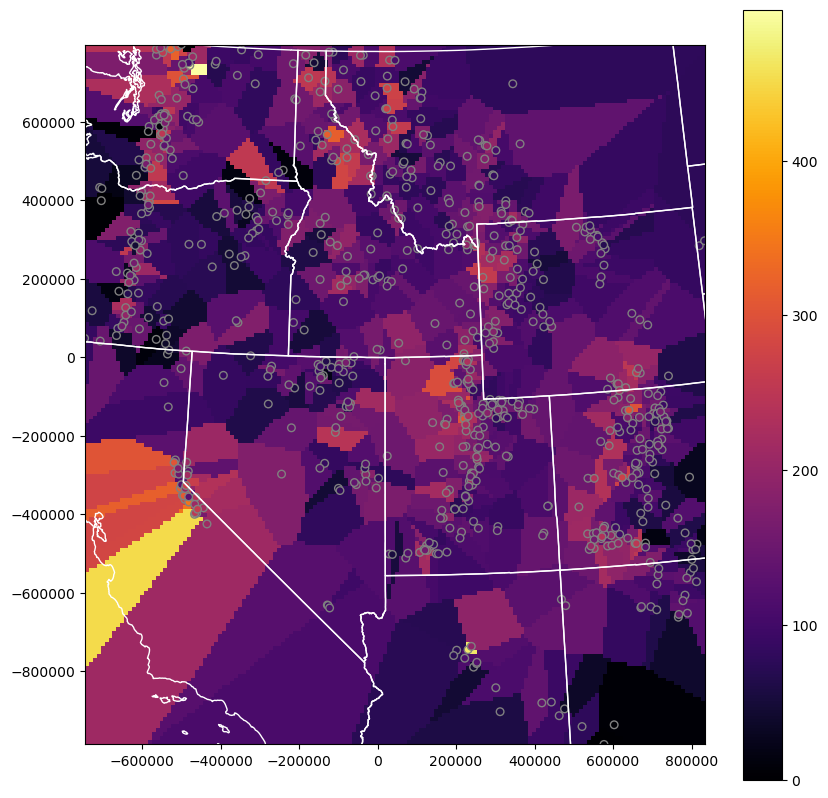

In [ ]:
#Create 2D grids from the xi and yi grid cell coordinates
xx, yy = np.meshgrid(xi, yi)
#Interpolate values using griddata
zi = scipy.interpolate.griddata((x,y), z, (xx, yy), method='nearest')
plotinterp(zi)

## Radial basis function interpolation
* https://en.wikipedia.org/wiki/Radial_basis_function_interpolation

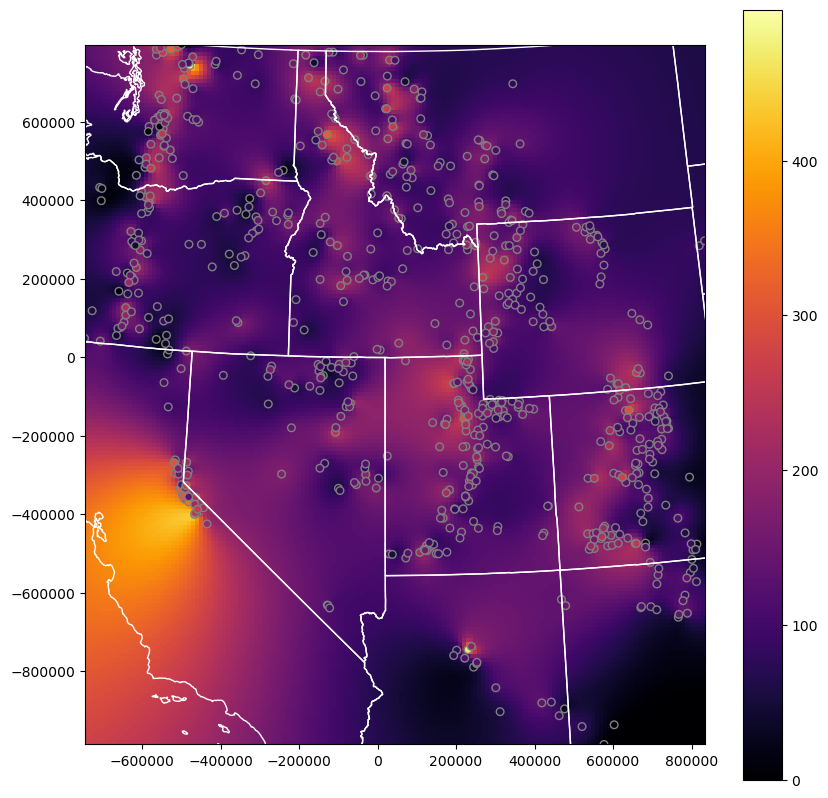

In [ ]:
#Use Radial basis function interpolation
f = scipy.interpolate.Rbf(x,y,z, function='linear')
zi = f(xx, yy)
plotinterp(zi)

### Explore this a bit
* Try a few different interpolation methods for griddata and Rbf
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.griddata.html#scipy.interpolate.griddata
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.Rbf.html#scipy.interpolate.Rbf
* Extra Credit: Play around with some other unstructured data interpolation methods
    * https://docs.scipy.org/doc/scipy/reference/interpolate.html#multivariate-interpolation
    * Others outside of scipy.interpolate

### Which approach do you think offers a more realistic representation for a variable like snow depth ✍️

#Student Exercise

### Write out the interpolated snow depth grid using rasterio (raster review)

In [ ]:
#Grid origin (center of pixel?)
origin = (xi.min(), yi.min())
print(origin)
#Grid cell size
print(dx, dy)

(-746621.0, -986535.0)
10000 10000


In [ ]:
#https://gis.stackexchange.com/questions/279953/numpy-array-to-gtiff-using-rasterio-without-source-raster
import rasterio as rio

transform = rio.transform.from_origin(xi.min(), yi.max(), dx, dy)

out_fn = 'snotel_interp_test.tif'
new_dataset = rio.open(out_fn, 'w', driver='GTiff',
                            height = zi.shape[0], width = zi.shape[1],
                            count=1, dtype=str(zi.dtype),
                            crs=gdf.crs,
                            transform=transform)

new_dataset.write(zi[::-1,], 1)
new_dataset.close()

In [ ]:
!ls -lh $out_fn

-rw-r--r-- 1 jovyan users 222K Mar 11 19:21 snotel_interp_test.tif


### Load from disk to verify

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 158, 'height': 179, 'count': 1, 'crs': CRS.from_wkt('PROJCS["unknown",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",42],PARAMETER["longitude_of_center",-114.27],PARAMETER["standard_parallel_1",37],PARAMETER["standard_parallel_2",47],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'), 'transform': Affine(10000.0, 0.0, -746621.0,
       0.0, -10000.0, 793465.0), 'blockysize': 6, 'tiled': False, 'interleave': 'band'}


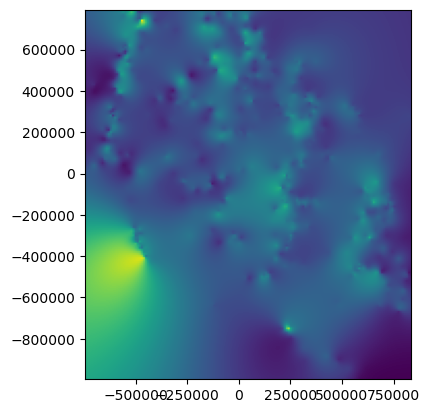

In [ ]:
from rasterio.plot import show
with rio.open(out_fn) as src:
    print(src.profile)
    show(src)

## Extra Credit: Clip interpolated grid to buffered radius around all stations
* Clip the interpolated rasters within 20 km of stations

## Extra Credit: Limit interpolation or clip to...
* Mountain ecoregion: https://www.epa.gov/eco-research/level-iii-and-iv-ecoregions-continental-united-states
* Mountain classes: https://rmgsc.cr.usgs.gov/gme/
* Observed recent snowcover mask derived from MODIS data for the corresponding date
    * See great resource **Snow Today** at the National Snow and Ice Data Center: https://nsidc.org/snow-today

## Extra Credit: Spatial Correlation, Semivariogram Analysis and Kriging
* I ran out of time on this, but showing some simple example code from skgstat

#### Resources:
* https://scikit-gstat.readthedocs.io/en/latest/
* https://scikit-learn.org/stable/modules/gaussian_process.html

#### Some useful examples:
* http://darribas.org/gds15/content/labs/lab_06.html  
* http://darribas.org/gds_scipy16/ipynb_md/04_esda.html

#### See some of the nice documentation in `xdem`
* https://xdem.readthedocs.io/en/latest/spatialstats.html

In [ ]:
!mamba install -c conda-forge -q -y scikit-gstat

Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done


In [ ]:
import skgstat as skg

In [ ]:
#These are elevation values for the sites
coords = np.stack([sites_gdf_all_proj.geometry.x.values, sites_gdf_all_proj.geometry.y.values], axis=1)
col = 'elevation_m'
vals = sites_gdf_all_proj[col].values

In [ ]:
#These are values from above interpolation
#coords = np.stack([x.values, y.values], axis=1)
#vals = z.values

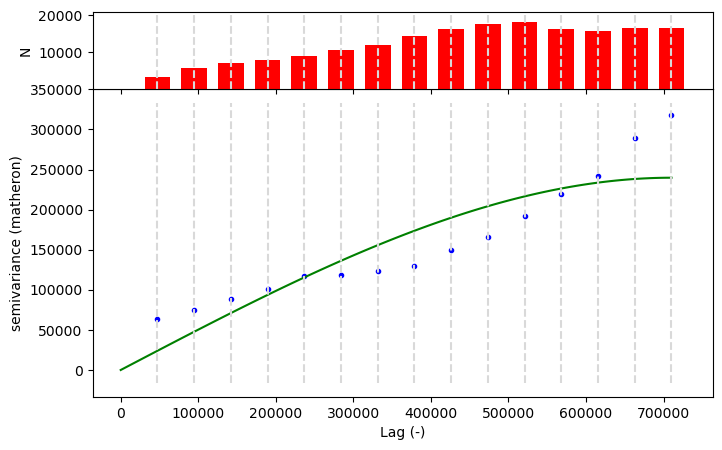

In [ ]:
V = skg.Variogram(coords, vals.flatten(), maxlag='median', n_lags=15, normalize=False)
fig = V.plot(show=False)

In [ ]:
print('Sample variance: %.2f   Variogram sill: %.2f' % (vals.flatten().var(), V.describe()['sill']))

Sample variance: 450311.11   Variogram sill: 239843.73


In [ ]:
print(V.describe())

{'model': 'spherical', 'estimator': 'matheron', 'dist_func': 'euclidean', 'normalized_effective_range': 504396187723.1311, 'normalized_sill': 76153749776.40479, 'normalized_nugget': 0, 'effective_range': 710208.552274, 'sill': 239843.73263309486, 'nugget': 0, 'params': {'estimator': 'matheron', 'model': 'spherical', 'dist_func': 'euclidean', 'bin_func': 'even', 'normalize': False, 'fit_method': 'trf', 'fit_sigma': None, 'use_nugget': False, 'maxlag': 710208.5522740001, 'n_lags': 15, 'verbose': False}, 'kwargs': {}}


In [ ]:
ok = skg.OrdinaryKriging(V, min_points=5, max_points=15, mode='exact')

In [ ]:
#ok.transform(xx.flatten(), yy.flatten()).reshape(xx.shape)

In [ ]:
#np.mgrid[x.min():x.max():100j, y.min():y.max():100j].shape

In [ ]:
# build the target grid
#x = coords[:, 0]
#y = coords[:, 1]
xx, yy = np.mgrid[x.min():x.max():100j, y.min():y.max():100j]
field = ok.transform(xx.flatten(), yy.flatten()).reshape(xx.shape)
s2 = ok.sigma.reshape(xx.shape)

(0.0, 100.0)

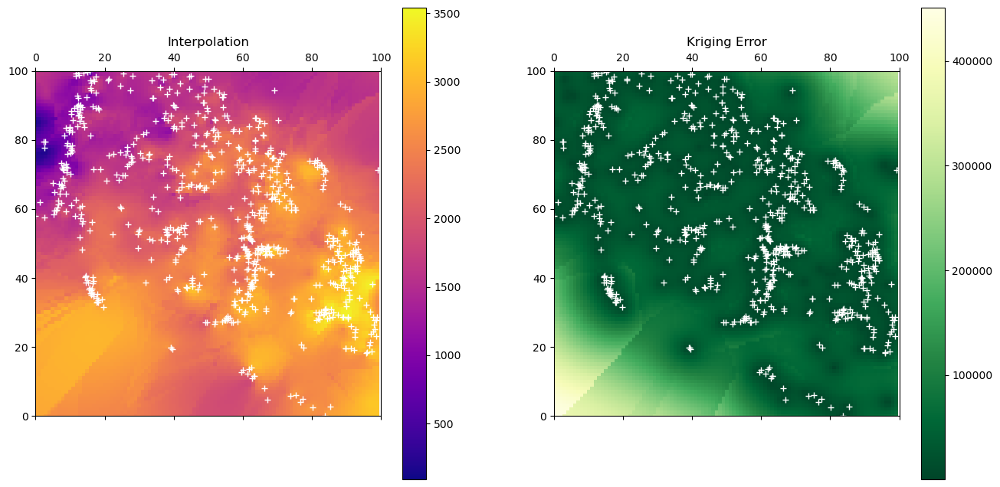

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# rescale the coordinates to fit the interpolation raster
x_ = (x - x.min()) / (x.max() - x.min()) * 100
y_ = (y - y.min()) / (y.max() - y.min()) * 100

art = axes[0].matshow(field.T, origin='lower', cmap='plasma', vmin=vals.min(), vmax=vals.max())
axes[0].set_title('Interpolation')
axes[0].plot(x_, y_, '+w')
axes[0].set_xlim((0, 100))
axes[0].set_ylim((0, 100))
plt.colorbar(art, ax=axes[0])
art = axes[1].matshow(s2.T, origin='lower', cmap='YlGn_r')
axes[1].set_title('Kriging Error')
plt.colorbar(art, ax=axes[1])
axes[1].plot(x_, y_, '+w')
axes[1].set_xlim((0, 100))
axes[1].set_ylim((0, 100))

## Extra Credit: Snow depth vs. elevation analysis for WA
* Let's look at snow depth across WA on the most recent day in the record
* Create a quick scatterplot of elevation vs. snow depth for all sites on this day
* Do you see a relationship?  

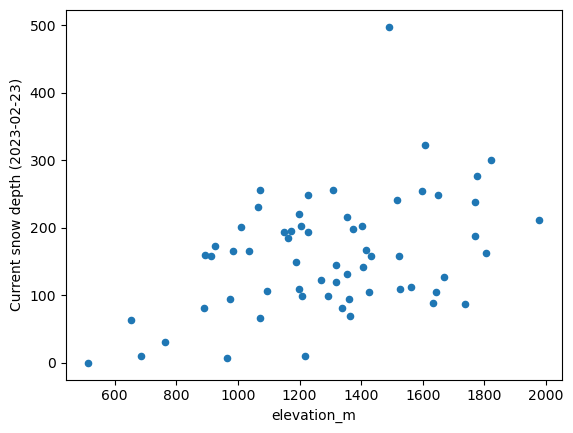

In [ ]:
#Student Exercise

### Try elevation vs. long-term mean

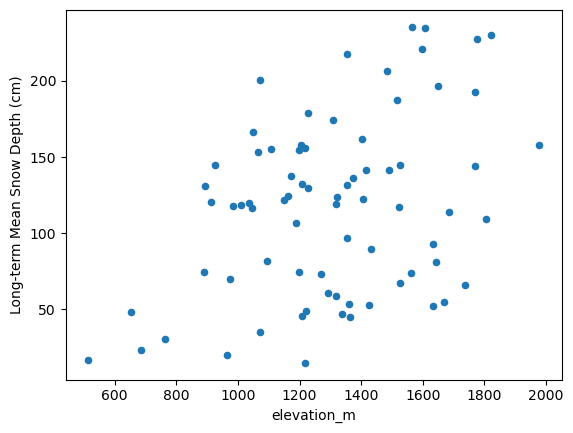

In [ ]:
#Student Exercise

## Extra Credit: Linear regression of snow depth vs. elevation
* Several convenient options in Python.  Here are a few:
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html 
    * https://www.statsmodels.org/dev/examples/notebooks/generated/ols.html
* How good is your fit?
* Compare accumulation vs elevation for a recent storm event with abundant lowland snow (e.g., Feb 11) with another more typical accumulation event (where low elevations receive rain and mountains receive snow)

r-squared: 0.1454451039112109


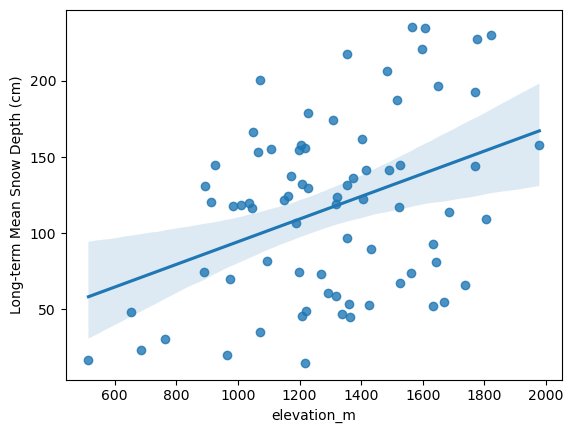

In [ ]:
#Student Exercise

In [ ]:
#Student Exercise

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                  
==========================================================================================
Dep. Variable:     Long-term Mean Snow Depth (cm)   R-squared:                       0.145
Model:                                        OLS   Adj. R-squared:                  0.134
Method:                             Least Squares   F-statistic:                     12.42
Date:                            Sat, 11 Mar 2023   Prob (F-statistic):           0.000736
Time:                                    19:23:27   Log-Likelihood:                -404.86
No. Observations:                              75   AIC:                             813.7
Df Residuals:                                  73   BIC:                             818.3
Df Model:                                       1                                         
Covariance Type:                        nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          19.9821     28.267      0.707      0.482     -36.354      76.319
elevation_m     0.0744      0.021      3.525      0.001       0.032       0.117
==============================================================================
Omnibus:                       12.613   Durbin-Watson:                   1.910
Prob(Omnibus):                  0.002   Jarque-Bera (JB):                3.595
Skew:                           0.040   Prob(JB):                        0.166
Kurtosis:                       1.930   Cond. No.                     6.04e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.04e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Extra Credit: Consider other variables that could affect snow depth
* Distance from the coast (remember the Lab06 exercise calculating distance from WA perimiter?)
* Mean winter daily temperature (from PRISM)

## Extra credit (or, some additional items to explore)

If you have some time (or curiosity), feel free to explore some of these, or define your own questions.  This is a really rich dataset, and those of you interested in snow or hydrology may have some cool ideas.

1. Compute snow depth statistics across all sites grouping by Water Year (or by month/day range where snow is typically present)
1. Identify date of first major snow accumulation event each year, date of max snow depth, date of snow disappearance - any evolution over time?
1. Split sites into elevation bands and analyze various metrics
1. Perform watershed-scale analysis
1. Explore other interpolation methods for sparse data
1. Create an animated map of daily accumulation in WA for the past two weeks
1. Look at other variables for the SNOTEL sites (e.g., snow water equivalent, temperature data)
    * Note that WTEQ_D time series begin much earlier than SNWD_D
1. Create maps of snow density for WA using WTEQ_D and SNWD_D